## Importing necessary libraries

In [3]:
from math import sin, pi
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from scipy.linalg import expm
from numpy import linalg as LA
import cvxpy as cp  # https://www.cvxpy.org/
from qpsolvers import solve_qp # https://qpsolvers.github.io/qpsolvers/quadratic-programming.html#qpsolvers.solve_qp
from control import dare, dlqr
from utils import solve_condensed_mpc, gen_prediction_matrices # found inside tutorial directory
import scipy as sp

   
from scipy.spatial import ConvexHull, HalfspaceIntersection
from shapely.geometry import Polygon
import geopandas as gpd
from scipy.optimize import linprog
# from lqr_set import remove_redundant_constraints

## Utils

In [4]:
def plot_results(N, x_bar_sp, u_bar_sp):
    """
    Plots:
    - State evolution over time (8 states)
    - Control input sequence (2 inputs)
    - 2D trajectory (x, y)
    """

    state_labels = ["x (m)", "y (m)", "psi (rad)", "theta (rad)",
                    "vx (m/s)", "vy (m/s)", "psi_dot (rad/s)", "theta_dot (rad/s)"]

    time_steps = range(N + 1)  # Time steps from 0 to N

    # ---- 1. Plot State Evolution Over Time ----
    plt.figure(figsize=(11, 8))
    for i in range(8):  # Loop over all 8 states
        plt.subplot(4, 2, i + 1)
        plt.plot(time_steps, np.round(x_bar_sp[:, i], 2), "-o", markersize=3, label=state_labels[i])
        plt.xlabel("Time step")
        plt.ylabel(state_labels[i])
        plt.legend()
        plt.grid()
    
    plt.tight_layout()
    plt.show()

    # ---- 2. Plot 2D State Trajectory (x, y) ----
    plt.figure(figsize=(6, 5))
    plt.plot(np.round(x_bar_sp[:, 0],2), np.round(x_bar_sp[:, 1],2), 'o-', markersize=3)
    plt.xlabel('x (m)')
    plt.ylabel('y (m)')
    plt.title('State Sequence (x, y)')
    plt.grid()
    plt.show()

    # ---- 3. Plot Control Input Sequence ----
    plt.figure(figsize=(6, 4))
    plt.step(range(N), u_bar_sp[:, 0], label='u1 (Thrust 1)', color='blue')
    plt.step(range(N), u_bar_sp[:, 1], label='u2 (Thrust 2)', color='red')
    plt.xlabel('Time step')
    plt.ylabel('Control Input')
    plt.title('Input Sequence')
    plt.legend()
    plt.grid()
    plt.show()

In [5]:
def compare_results(N, x_bar1, u_bar1, x_bar2, u_bar2):
    """
    Plots:
    - State evolution over time (8 states)
    - Control input sequence (2 inputs)
    - 2D trajectory (x, y)
    """

    state_labels = ["x (m)", "y (m)", "psi (rad)", "theta (rad)",
                    "vx (m/s)", "vy (m/s)", "psi_dot (rad/s)", "theta_dot (rad/s)"]

    time_steps = range(N + 1)  # Time steps from 0 to N

    # ---- 1. Plot State Evolution Over Time ----
    plt.figure(figsize=(11, 8))
    for i in range(8):  # Loop over all 8 states
        plt.subplot(4, 2, i + 1)
        
        plt.plot(time_steps, np.round(x_bar1[:, i], 2), "--r", markersize=2, label=state_labels[i]+' Set 1')
        plt.plot(time_steps, np.round(x_bar2[:, i], 2), "--g", markersize=2, label=state_labels[i]+' Set 2')
        
        plt.xlabel("Time step")
        plt.ylabel(state_labels[i])
        plt.legend()
        plt.grid()
    
    plt.tight_layout()
    plt.show()

    # ---- 2. Plot 2D State Trajectory (x, y) ----
    plt.figure(figsize=(6, 5))
    plt.plot(np.round(x_bar1[:, 0],2), np.round(x_bar1[:, 1],2), 'r-', markersize=3, label='Trajectory Set 1')
    plt.plot(np.round(x_bar2[:, 0],2), np.round(x_bar2[:, 1],2), 'g-', markersize=3, label='Trajectory Set 2')
    plt.xlabel('x (m)')
    plt.ylabel('y (m)')
    plt.title('State Sequence (x, y)')
    plt.grid()
    plt.show()

    # ---- 3. Plot Control Input Sequence ----
    plt.figure(figsize=(6, 4))
    
    plt.step(range(N), u_bar1[:, 0], label='u1 (Thrust 1) Set 1', color='blue')
    plt.step(range(N), u_bar1[:, 1], label='u2 (Thrust 2) Set 1', color='red')

    plt.step(range(N), u_bar2[:, 0], label='u1 (Thrust 1) Set 2', color='g')
    plt.step(range(N), u_bar2[:, 1], label='u2 (Thrust 2) Set 2', color='C1')
    
    plt.xlabel('Time step')
    plt.ylabel('Control Input')
    plt.title('Input Sequence')
    plt.legend()
    plt.grid()
    plt.show()

In [6]:
def animate_dynamics(q_hist, L_l=1.5):
    """
    Function to animate the dynamics of a drone with a suspended load.
    
    Args:
    - q_hist (ndarray): The state history of the system, where each row corresponds to:
        [x, y, psi, theta]
    - L_l (float): Length of the suspended load.
    - t_hist (ndarray): Time history corresponding to the frames.
    
    Returns:
    - HTML: The animated visualization of the system.
    """
    x_hist, y_hist, psi_hist, theta_hist = q_hist[:,0], q_hist[:,1], q_hist[:,2], q_hist[:,3]
    t_hist = np.arange(len(q_hist))
    
    # Set up figure for animation
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)
    ax.set_xlabel("X (m)")
    ax.set_ylabel("Y (m)")
    ax.grid()
    
    # Initialize drone and load lines
    drone_body, = ax.plot([], [], "bo-", markersize=8, label="Drone Body")
    load_line, = ax.plot([], [], "r-", linewidth=2, label="Suspended Load")
    
    def update(frame):
        """ Update animation frame. """
        x, y, psi, theta = x_hist[frame], y_hist[frame], psi_hist[frame], theta_hist[frame]
        
        # Drone body points
        drone_x = [x - np.cos(psi), x + np.cos(psi)]
        drone_y = [y - np.sin(psi), y + np.sin(psi)]
        
        # Load position
        load_x = x + L_l * np.sin(theta)
        load_y = y - L_l * np.cos(theta)
    
        # Update elements
        drone_body.set_data(drone_x, drone_y)
        load_line.set_data([x, load_x], [y, load_y])
    
        return drone_body, load_line
    
    ani2 = animation.FuncAnimation(fig, update, frames=len(t_hist), interval=50, blit=True)
    
    return HTML(ani2.to_jshtml())

In [7]:
def animate_trajectory(states):
    """
    Creates an animation of the drone trajectory.
    """
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_title("Drone Trajectory")
    ax.set_xlabel("X (m)")
    ax.set_ylabel("Y (m)")
    line, = ax.plot([], [], 'bo-', markersize=3)
    t_hist = np.arange(len(states))

    def update_frame(frame):
        line.set_data(states[:frame,0], states[:frame,1])
        return line,

    ani = FuncAnimation(fig, update_frame, frames=len(t_hist), interval=100, blit=True)
    return HTML(ani.to_jshtml())

### Testing 

In [8]:
# def drone2D_dynamics(q, u, L_l=1.5):
#     """
#     Computes the dynamics of a 2D drone with a suspended load.
#     """
#     m_d = 1.0  # Drone mass (kg)
#     m_l = 0.1  # Load mass (kg)
#     g = 9.81  # Gravity (m/s^2)
#     d = 2.0  # Distance between rotors (m)
#     I_d = 0.8  # Drone moment of inertia (kg*m^2)
#     L_d = d / 2  # Distance from drone COM to each thruster (m)

#     # Total mass
#     m_tot = m_d + m_l

#     # Baseline thrust for hovering
#     baseline = m_tot * g / 2.0

#     # Unpack state variables
#     x, y, psi, theta, vx, vy, psi_dot, theta_dot = q
#     u1, u2 = u  # Control inputs (added thrust deviations)

#     # Compute actual thrusts
#     F1 = baseline + u1
#     F2 = baseline + u2
#     F_T = F1 + F2  # Total thrust
#     torque = L_d * (F2 - F1)  # Torque generated by thrust imbalance

#     # Compute accelerations
#     D_xy = -m_d**2 + m_d*m_l*np.sin(theta)**2 + m_d*m_l*np.cos(theta)**2 - 2*m_d*m_l + m_l**2 * np.sin(theta)**2 + m_l**2 * np.cos(theta)**2 - m_l**2
#     D_theta = -L_l * m_d + L_l * m_l * np.sin(theta)**2 + L_l * m_l * np.cos(theta)**2 - L_l * m_l

#     ddx = (F_T * (m_d*np.sin(psi) - m_l*np.sin(psi)*np.sin(theta)**2 + m_l*np.sin(psi) - m_l*np.sin(theta)*np.cos(psi)*np.cos(theta))
#            + L_l * (-m_d*m_l*np.sin(theta)*theta_dot**2 + m_l**2 *np.sin(theta)**3 * theta_dot**2)
#            + L_l * (m_l**2 * np.sin(theta) * np.cos(theta)**2 * theta_dot**2 - m_l**2 * np.sin(theta) * theta_dot**2)) / D_xy

#     ddy = (F_T * (-m_d * np.cos(psi) + m_l*np.sin(psi)*np.sin(theta)*np.cos(theta) + m_l * np.cos(psi) * np.cos(theta)**2 - m_l*np.cos(psi))
#            + g * (m_d**2 - m_d*m_l*np.sin(theta)**2 - m_d*m_l*np.cos(theta)**2 + 2*m_d*m_l - m_l**2 * np.sin(theta)**2 - m_l**2 * np.cos(theta)**2 + m_l**2)
#            + L_l * (m_d*m_l*np.cos(theta)*theta_dot**2 - m_l**2 * np.sin(theta)**2 * np.cos(theta) * theta_dot**2 - m_l**2 * np.cos(theta)**3 * theta_dot**2 + m_l**2 * np.cos(theta) * theta_dot**2)) / D_xy

#     ddtheta = F_T * (-np.sin(psi) * np.cos(theta) + np.cos(psi) * np.sin(theta)) / D_theta
#     ddpsi = torque / I_d

#     q_dot = np.array([vx, vy, psi_dot, theta_dot, ddx, ddy, ddpsi, ddtheta])

#     return q_dot

# def forward_euler(q0, Tf, dt, input_fun):
#     """
#     Performs forward Euler integration.
#     """
#     t_hist = np.arange(0, Tf, dt)
#     num_points = len(t_hist)
#     dim_x = len(q0)
#     q_hist = np.zeros((dim_x, num_points))
#     u_hist = np.zeros((2, num_points))
#     q_hist[:, 0] = q0

#     for k in range(num_points - 1):
#         t_k = t_hist[k]
#         u_k = input_fun(t_k)
#         q_dot = drone2D_dynamics(q_hist[:, k], u_k)
#         q_hist[:, k + 1] = q_hist[:, k] + dt * q_dot
#         u_hist[:, k] = u_k

#     return q_hist, t_hist, u_hist

# def rk4_step(q, u, dt):
#     """Performs a single step of Runge-Kutta 4 integration."""
#     k1 = drone2D_dynamics(q, u)
#     k2 = drone2D_dynamics(q + 0.5 * dt * k1, u)
#     k3 = drone2D_dynamics(q + 0.5 * dt * k2, u)
#     k4 = drone2D_dynamics(q + dt * k3, u)
#     return q + (dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)

# def runge_kutta(q0, Tf, dt, input_fun):
#     """Performs Runge-Kutta 4 integration."""
#     t_hist = np.arange(0, Tf, dt)
#     num_points = len(t_hist)
#     dim_x = len(q0)
#     q_hist = np.zeros((dim_x, num_points))
#     u_hist = np.zeros((2, num_points))
#     q_hist[:, 0] = q0

#     for k in range(num_points - 1):
#         t_k = t_hist[k]
#         u_k = input_fun(t_k)
#         q_hist[:, k + 1] = rk4_step(q_hist[:, k], u_k, dt)
#         u_hist[:, k] = u_k

#     return q_hist, t_hist, u_hist

# def simulate(q0, Tf, dt, input_fun, method="euler"):
#     """Runs the simulation using the selected integration method."""
#     if method == "euler":
#         return forward_euler(q0, Tf, dt, input_fun)
#     elif method == "rk4":
#         return runge_kutta(q0, Tf, dt, input_fun)
#     else:
#         raise ValueError("Invalid integration method. Choose 'euler' or 'rk4'.")


In [9]:
# q_hist, t_hist, u_hist = simulate(np.array([1,1,np.pi/6,np.pi/12,0,0,0,0]), Tf=5, dt=0.01, input_fun=input_fun_from_sequence, method="euler")

In [10]:
# def input_fun_from_sequence(t):
#     """
#     Returns control inputs [u1, u2] based on a predefined input sequence.

#     Parameters:
#     - input_seq (np.array): A (50,2) array containing input values over time.
#     - t (float): The current simulation time.
#     - dt (float): The time step of the simulation.
#     - repeat_last (bool): If True, keep using the last input when t exceeds sequence length.

#     Returns:
#     - np.array: A (2,) array containing control inputs [u1, u2] for time t.
#     """
#     input_seq = u_bar_sp
#     dt=0.01
#     repeat_last=True
    
#     num_inputs = input_seq.shape[0]  # Number of available input time steps
#     max_time = (num_inputs - 1) * dt  # Maximum time covered by the sequence

#     # Compute index corresponding to time `t`
#     index = int(t / dt)

#     # If t exceeds available inputs
#     if index >= num_inputs:
#         if repeat_last:
#             return input_seq[-1]  # Use last available input
#         else:
#             return np.array([0, 0])  # Default to zero input

#     return input_seq[index]  # Return the corresponding input


## Creating 2D Drone Simulation Class

In [11]:
class Drone2DSimulation:
    def __init__(self, q0, Tf, dt, input_fun, method="euler"):
        self.q0 = q0
        self.Tf = Tf
        self.dt = dt
        self.input_fun = input_fun
        self.q_hist = None
        self.t_hist = None
        self.u_hist = None
        self.L_l = 1.5  # Length of the massless rod suspending the load (m)
        self.method = method  # Choose between 'euler' and 'rk4'

    def drone2D_dynamics(self, q, u):
        """
        Computes the dynamics of a 2D drone with suspended load.
        """
        m_d = 1.0  # Drone mass (kg)
        m_l = 0.1  # Load mass (kg)
        g = 9.81  # Gravity (m/s^2)
        d = 2.0  # Distance between rotors (m)
        I_d = 0.8  # Drone moment of inertia (kg*m^2)
        L_d = d / 2  # Distance from drone COM to each thruster (m)
        
        # Total mass
        m_tot = m_d + m_l

        # Baseline thrust for hovering
        baseline = m_tot * g / 2.0

        # Unpack state variables
        x, y, psi, theta, vx, vy, psi_dot, theta_dot = q
        u1, u2 = u  # Control inputs (added thrust deviations)

        # Compute actual thrusts
        F1 = baseline + u1
        F2 = baseline + u2
        F_T = F1 + F2  # Total thrust
        torque = L_d * (F2 - F1)  # Torque generated by thrust imbalance

        # Compute accelerations
        D_xy = -m_d**2 + m_d*m_l*np.sin(theta)**2 + m_d*m_l*np.cos(theta)**2 - 2*m_d*m_l + m_l**2 * np.sin(theta)**2 + m_l**2 * np.cos(theta)**2 - m_l**2
        D_theta = -self.L_l * m_d + self.L_l * m_l * np.sin(theta)**2 + self.L_l * m_l * np.cos(theta)**2 - self.L_l * m_l

        ddx = (F_T * (m_d*np.sin(psi) - m_l*np.sin(psi)*np.sin(theta)**2 + m_l*np.sin(psi) - m_l*np.sin(theta)*np.cos(psi)*np.cos(theta))
               + self.L_l * (-m_d*m_l*np.sin(theta)*theta_dot**2 + m_l**2 *np.sin(theta)**3 * theta_dot**2)
               + self.L_l * (m_l**2 * np.sin(theta) * np.cos(theta)**2 * theta_dot**2 - m_l**2 * np.sin(theta) * theta_dot**2)) / D_xy

        ddy = (F_T * (-m_d * np.cos(psi) + m_l*np.sin(psi)*np.sin(theta)*np.cos(theta) + m_l * np.cos(psi) * np.cos(theta)**2 - m_l*np.cos(psi))
               + g * (m_d**2 - m_d*m_l*np.sin(theta)**2 - m_d*m_l*np.cos(theta)**2 + 2*m_d*m_l - m_l**2 * np.sin(theta)**2 - m_l**2 * np.cos(theta)**2 + m_l**2)
               + self.L_l * (m_d*m_l*np.cos(theta)*theta_dot**2 - m_l**2 * np.sin(theta)**2 * np.cos(theta) * theta_dot**2 - m_l**2 * np.cos(theta)**3 * theta_dot**2 + m_l**2 * np.cos(theta) * theta_dot**2)) / D_xy

        ddtheta = F_T * (-np.sin(psi) * np.cos(theta) + np.cos(psi) * np.sin(theta)) / D_theta
        ddpsi = torque / I_d

        q_dot = np.array([vx, vy, psi_dot, theta_dot, ddx, ddy, ddpsi, ddtheta])

        return q_dot
    
    def forward_euler_w_input(self):
        """
        Performs forward Euler integration.
        """
        t_hist = np.arange(0, self.Tf, self.dt)
        num_points = len(t_hist)
        dim_x = len(self.q0)
        q_hist = np.zeros((dim_x, num_points))
        u_hist = np.zeros((2, num_points))
        q_hist[:, 0] = self.q0
        
        for k in range(num_points - 1):
            t_k = t_hist[k]
            u_k = self.input_fun(t_k)
            q_dot = self.drone2D_dynamics(q_hist[:, k], u_k)
            q_hist[:, k + 1] = q_hist[:, k] + self.dt * q_dot
            u_hist[:, k] = u_k

        self.q_hist = q_hist
        self.t_hist = t_hist
        self.u_hist = u_hist

        return q_hist, t_hist, u_hist

    def runge_kutta_w_input(self):
        """Performs Runge-Kutta 4 integration."""
        t_hist = np.arange(0, self.Tf, self.dt)
        num_points = len(t_hist)
        dim_x = len(self.q0)
        q_hist = np.zeros((dim_x, num_points))
        u_hist = np.zeros((2, num_points))
        q_hist[:, 0] = self.q0
        
        for k in range(num_points - 1):
            t_k = t_hist[k]
            u_k = self.input_fun(t_k)
            q_hist[:, k + 1] = self.rk4_step(q_hist[:, k], u_k)
            u_hist[:, k] = u_k

        self.q_hist = q_hist
        self.t_hist = t_hist
        self.u_hist = u_hist
        
        return q_hist, t_hist, u_hist

    def rk4_step(self, q, u):
        """Performs a single step of Runge-Kutta 4 integration."""
        k1 = self.drone2D_dynamics(q, u)
        k2 = self.drone2D_dynamics(q + 0.5 * self.dt * k1, u)
        k3 = self.drone2D_dynamics(q + 0.5 * self.dt * k2, u)
        k4 = self.drone2D_dynamics(q + self.dt * k3, u)
        return q + (self.dt / 6) * (k1 + 2 * k2 + 2 * k3 + k4)

    def simulate(self):
        """Runs the simulation using the selected integration method."""
        if self.method == "euler":
            return self.forward_euler_w_input()
        elif self.method == "rk4":
            return self.runge_kutta_w_input()
        else:
            raise ValueError("Invalid integration method. Choose 'euler' or 'rk4'.")
    
    def plot_results(self, ):
        """
        Plots the simulation results.
        """
        state_labels = ["x (m)", "y (m)", "psi (rad)", "theta (rad)",
                        "vx (m/s)", "vy (m/s)", "psi_dot (rad/s)", "theta_dot (rad/s)"]
        plt.figure(figsize=(12, 8))
        for i in range(8):
            plt.subplot(4, 2, i + 1)
            plt.plot(self.t_hist, self.q_hist[i, :], "-o", markersize=3)
            plt.xlabel("Time (s)")
            plt.ylabel(state_labels[i])
            plt.grid()
        plt.tight_layout()
        plt.show()
        
        plt.figure(figsize=(6, 4))
        plt.plot(self.t_hist, self.u_hist[0, :], label="u1 (Thrust 1)", color='blue')
        plt.plot(self.t_hist, self.u_hist[1, :], label="u2 (Thrust 2)", color='red')
        plt.xlabel("Time (s)")
        plt.ylabel("Control Inputs")
        plt.title("Control Inputs [u1, u2]")
        plt.legend()
        plt.grid()
        plt.show()
    
    def animate_trajectory(self):
        """
        Creates an animation of the drone trajectory.
        """
        fig, ax = plt.subplots(figsize=(6, 6))
        ax.set_xlim(-1, 1)
        ax.set_ylim(-1, 1)
        ax.set_title("Drone Trajectory")
        line, = ax.plot([], [], 'bo-', markersize=3)

        def update_frame(frame):
            line.set_data(self.q_hist[0, :frame], self.q_hist[1, :frame])
            return line,

        ani = FuncAnimation(fig, update_frame, frames=len(self.t_hist), interval=100, blit=True)
        return HTML(ani.to_jshtml())

    def animate_dynamics(self):
        x_hist, y_hist, psi_hist, theta_hist = self.q_hist[0, :], self.q_hist[1, :], self.q_hist[2, :], self.q_hist[3, :]
        
        # Set up figure for animation
        fig, ax = plt.subplots(figsize=(6, 6))
        ax.set_xlim(-2, 2)
        ax.set_ylim(-2, 2)
        ax.set_xlabel("X (m)")
        ax.set_ylabel("Y (m)")
        ax.grid()
        
        # Initialize drone and load lines
        drone_body, = ax.plot([], [], "bo-", markersize=8, label="Drone Body")
        load_line, = ax.plot([], [], "r-", linewidth=2, label="Suspended Load")
        
        def update(frame):
            """ Update animation frame. """
            x, y, psi, theta = x_hist[frame], y_hist[frame], psi_hist[frame], theta_hist[frame]
            
            # Drone body points
            drone_x = [x - np.cos(psi), x + np.cos(psi)]
            drone_y = [y - np.sin(psi), y + np.sin(psi)]
            
            # Load position
            load_x = x + self.L_l * np.sin(theta)
            load_y = y - self.L_l * np.cos(theta)
        
            # Update elements
            drone_body.set_data(drone_x, drone_y)
            load_line.set_data([x, load_x], [y, load_y])
        
            return drone_body, load_line
            
        ani2 = animation.FuncAnimation(fig, update, frames=len(t_hist), interval=50, blit=True)
        return HTML(ani2.to_jshtml())


## Testing with no inputs

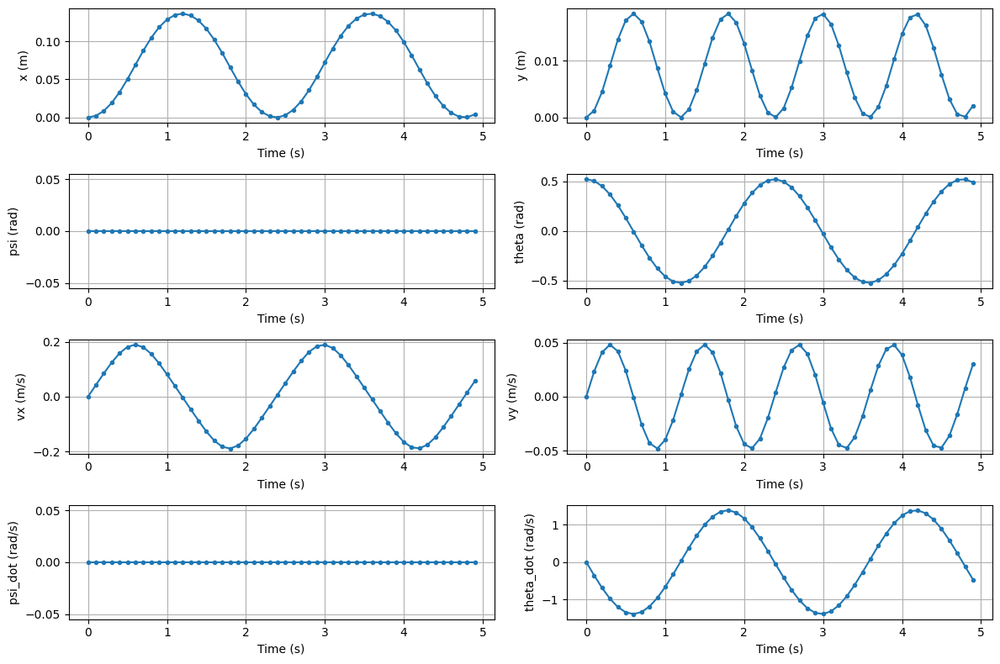

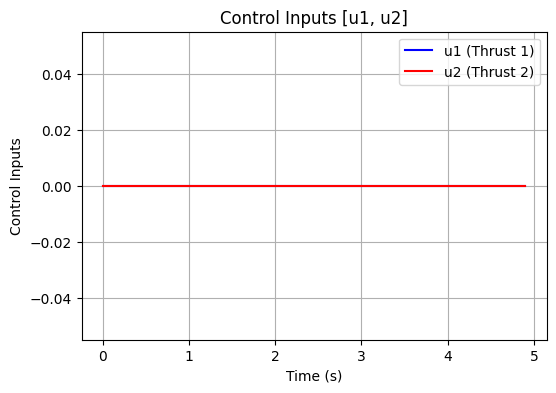

In [12]:
def input_fun(t):
    """
    Returns control inputs [u1, u2] as a function of time.
    - Initially, no extra thrust (hovering).
    - Later, a small force difference is introduced for tilting.
    """
    if t < 2.0:
        return np.array([0, 0])  # Perfect hover
    else:
        return np.array([0.0, 0.0])  # Apply differential thrust

# q0 = np.array([0, 0, 0, np.pi / 12, 0, 0, 0, 0])
# dt = 0.1
# Tf = 5.0

# sim = Drone2DSimulation(q0, Tf, dt, input_fun)
# sim.forward_euler_w_input()
# sim.plot_results()


# Initial conditions: [x, y, psi, theta, vx, vy, psi_dot, theta_dot]
q0 = np.array([0, 0, 0, np.pi / 6, 0, 0, 0, 0])

# Simulation parameters
Tf = 5.0  # Total simulation time
dt = 0.1  # Time step

# Run simulation with RK4
drone = Drone2DSimulation(q0, Tf, dt, input_fun, method="rk4")
q_hist, t_hist, u_hist = drone.simulate()
drone.plot_results()

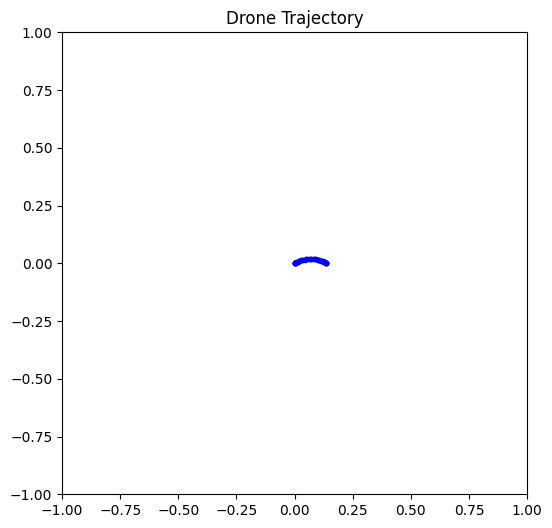

In [13]:
HTML(drone.animate_trajectory().data)

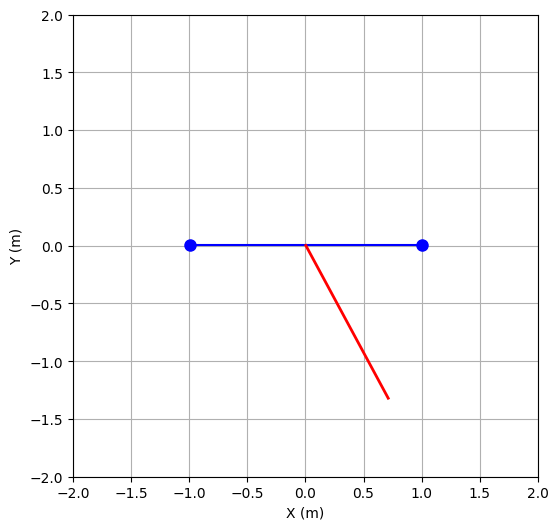

In [14]:
HTML(drone.animate_dynamics().data)

## Linearizing the system

In [15]:
# Double integrator dynamics
dim_x_d = 8
dim_u_d = 2

m_d = 1.0  # Drone mass (kg)
m_l = 0.1  # Load mass (kg)
g = 9.81  # Gravity (m/s^2)
d = 2.0  # Distance between rotors (m)
I_d = 0.8  # Drone moment of inertia (kg*m^2)
L_d = d / 2  # Distance from drone COM to each thruster (m)
L_l = 1.5  # Length of the massless rod suspending the load (m)

A_c = np.zeros(shape=(8,8))
A_c[:4, 4:] = np.eye(4)
A_c[4, 2] = - g * (m_d + m_l) / m_d
A_c[4, 3] = g * m_l / m_d
A_c[7, 2] = g * (m_d + m_l) / (m_d * L_l)
A_c[7, 3] = - g * (m_d + m_l) / (m_d * L_l)

B_c = np.zeros(shape=(8, 2))
B_c[5, 0] = 1/(m_d + m_l)
B_c[5, 1] = 1 / (m_d + m_l)
B_c[6, 0] = - L_d / I_d
B_c[6, 1] = L_d / I_d

print("A_c: \n",A_c)
print("B_c: \n",B_c)

assert A_c.shape == (dim_x_d, dim_x_d)
assert B_c.shape == (dim_x_d, dim_u_d)

A_c: 
 [[  0.      0.      0.      0.      1.      0.      0.      0.   ]
 [  0.      0.      0.      0.      0.      1.      0.      0.   ]
 [  0.      0.      0.      0.      0.      0.      1.      0.   ]
 [  0.      0.      0.      0.      0.      0.      0.      1.   ]
 [  0.      0.    -10.791   0.981   0.      0.      0.      0.   ]
 [  0.      0.      0.      0.      0.      0.      0.      0.   ]
 [  0.      0.      0.      0.      0.      0.      0.      0.   ]
 [  0.      0.      7.194  -7.194   0.      0.      0.      0.   ]]
B_c: 
 [[ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.90909091  0.90909091]
 [-1.25        1.25      ]
 [ 0.          0.        ]]


## **Exact** Discretization of LTI Systems

In [16]:
# Discretize the dynamics
dt = 0.1
# Trick to compute the matrix exponential

AB_c = np.zeros((dim_x_d + dim_u_d, dim_x_d + dim_u_d))
AB_c[:dim_x_d, :dim_x_d] = A_c
AB_c[:dim_x_d, dim_x_d:] = B_c
expm_AB_c = expm(AB_c*dt)
A_d = expm_AB_c[:dim_x_d, :dim_x_d]
B_d = expm_AB_c[:dim_x_d, dim_x_d:]

print(f"Ad:\n{A_d}")
print(f"Bd:\n{B_d}")

Ad:
[[ 1.00000000e+00  0.00000000e+00 -5.39256649e-02  4.87566495e-03
   1.00000000e-01  0.00000000e+00 -1.79791290e-03  1.62912897e-04]
 [ 0.00000000e+00  1.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  1.00000000e-01  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  1.00000000e-01  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  3.57548763e-02  9.64245124e-01
   0.00000000e+00  0.00000000e+00  1.19469458e-03  9.88053054e-02]
 [ 0.00000000e+00  0.00000000e+00 -1.07792800e+00  9.69280046e-02
   1.00000000e+00  0.00000000e+00 -5.39256649e-02  4.87566495e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  1.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  7.10805367e-01 -7.10805367e-01

In [15]:
eigenvalues_A_c, eigenvectors_A_c = LA.eig(A_c)
eigenvalues_A_d, eigenvectors_A_d = LA.eig(A_d)

print('Eigen Values A_c: \n', eigenvalues_A_c)  

print('Eigen Values A_d: \n', eigenvalues_A_d)  

Eigen Values A_c: 
 [0.+0.j         0.+0.j         0.+2.68216331j 0.-2.68216331j
 0.+0.j         0.+0.j         0.+0.j         0.+0.j        ]
Eigen Values A_d: 
 [1.        +0.j         1.        +0.j         0.96424512+0.26501196j
 0.96424512-0.26501196j 1.        +0.j         1.        +0.j
 1.        +0.j         1.        +0.j        ]


## Check System Stability and Controllability

In [16]:
def check_stability_controllability(A, B):
    """
    Check the stability and controllability of a discrete-time system.
    
    Parameters:
    A (numpy.ndarray): The state transition matrix of the system.
    B (numpy.ndarray): The input matrix of the system.
    
    Returns:
    stability (bool): True if the system is stable, False otherwise.
    controllability (bool): True if the system is controllable, False otherwise.
    """
    
    # Check the eigenvalues of A for stability
    eigenvalues_A = np.linalg.eigvals(A)
    print("Eigenvalues of A:", eigenvalues_A)
    
    # Stability check: All eigenvalues should have magnitude < 1
    stability = all(abs(ev) < 1 for ev in eigenvalues_A)
    if stability:
        print("The system is stable.")
    else:
        print("The system is unstable.")
    
    # Check the controllability matrix
    n = A.shape[0]  # Number of states
    C = B
    for i in range(1, n):
        C = np.hstack((C, np.linalg.matrix_power(A, i) @ B))
    
    # Check the rank of the controllability matrix
    rank_C = np.linalg.matrix_rank(C)
    print("Rank of the controllability matrix:", rank_C)
    
    # Controllability check: Full rank if rank equals number of states
    controllability = (rank_C == n)
    if controllability:
        print("The system is controllable.")
    else:
        print("The system is not controllable.")
    
    return stability, controllability

In [17]:
check_stability_controllability(A_d, B_d)

Eigenvalues of A: [1.        +0.j         1.        +0.j         0.96424512+0.26501196j
 0.96424512-0.26501196j 1.        +0.j         1.        +0.j
 1.        +0.j         1.        +0.j        ]
The system is unstable.
Rank of the controllability matrix: 8
The system is controllable.


(False, True)

# Linear MPC

## Sparse Formulation

In [18]:
def solve_mpc_sparse(Ad, Bd, Q, R, P, x0, N, u_lb, u_ub):
    dim_x = Ad.shape[0]
    dim_u = Bd.shape[1]

    # Define the optimization variables
    x_bar = cp.Variable((N+1, dim_x))
    u_bar = cp.Variable((N, dim_u))

    # Cost & constraints
    cost = 0.
    constraints = []
    constraints += [x_bar[0, :] == x0]
    for t in range(N):
        constraints += [x_bar[t+1, :] == Ad @ x_bar[t, :] + Bd @ u_bar[t, :]]
        constraints += [u_lb <= u_bar[t, :], u_bar[t, :] <= u_ub]

        cost += 0.5 * cp.quad_form(x_bar[t, :], Q) + 0.5 * cp.quad_form(u_bar[t, :], R)
    
    cost += 0.5 * cp.quad_form(x_bar[N, :], P)
    
    # Solve the problem
    prob = cp.Problem(cp.Minimize(cost), constraints)
    prob.solve()
    
    return x_bar.value, u_bar.value

## Dense Formulation

In [19]:
def gen_prediction_matrices(Ad, Bd, N):
    dim_x = Ad.shape[0]
    dim_u = Bd.shape[1]
    
    T = np.zeros(((dim_x * (N + 1), dim_x)))
    S = np.zeros(((dim_x * (N + 1), dim_u * N)))
    
    # Condensing
    power_matricies = []    # power_matricies = [I, A, A^2, ..., A^N]
    power_matricies.append(np.eye(dim_x))
    for k in range(N):
        power_matricies.append(power_matricies[k] @ Ad)
    
    for k in range(N + 1):
        T[k * dim_x: (k + 1) * dim_x, :] = power_matricies[k]
        for j in range(N):
            if k > j:
                S[k * dim_x:(k + 1) * dim_x, j * dim_u:(j + 1) * dim_u] = power_matricies[k - j - 1] @ Bd
                
    return T, S

In [20]:
# Kronecker product
R = np.diag([1, 2, 3])
R_bar_ = np.kron(np.eye(3), R)
print(f"R_bar_:\n{R_bar_}")

R_bar_:
[[1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 2. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 3. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 3. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 2. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 3.]]


In [21]:
def gen_cost_matrices(Q, R, P, T, S, x0, N):
    dim_x = Q.shape[0]
    
    Q_bar = np.zeros(((dim_x * (N + 1), dim_x * (N + 1))))
    Q_bar[-dim_x:, -dim_x:] = P
    Q_bar[:dim_x * N, :dim_x * N] = np.kron(np.eye(N), Q) 
    R_bar = np.kron(np.eye(N), R)
    
    H = S.T @ Q_bar @ S + R_bar
    h = S.T @ Q_bar @ T @ x0
    
    H = 0.5 * (H + H.T) # Ensure symmetry!
    
    return H, h

In [22]:
def gen_constraint_matrices(u_lb, u_ub, N):
    dim_u = u_lb.shape[0]
    
    Gu = np.zeros((2 * dim_u, dim_u))
    Gu[0: dim_u, :] = np.eye(dim_u)
    Gu[dim_u: , :] = -np.eye(dim_u)
    
    gu = np.zeros(2 * dim_u)
    gu[0: dim_u] = u_ub
    gu[dim_u:] = -u_lb    
    
    Gu_bar = np.kron(np.eye(N), Gu)
    gu_bar = np.kron(np.ones(N), gu)
    
    return Gu_bar, gu_bar

In [23]:
def solve_mpc_condensed(Ad, Bd, Q, R, P, x0, N, u_lb, u_ub):
    dim_u = Bd.shape[1]
    dim_x = Ad.shape[1]
    T, S = gen_prediction_matrices(Ad, Bd, N)
    H, h = gen_cost_matrices(Q, R, P, T, S, x0, N)
    Gu_bar, gu_bar = gen_constraint_matrices(u_lb, u_ub, N)
    
    u_bar = solve_qp(H, h, G=Gu_bar, h=gu_bar, solver='quadprog') 
    x_bar = T @ x0 + S @ u_bar
    x_bar = x_bar.reshape((N + 1, dim_x))
    u_bar = u_bar.reshape((N, dim_u))    
    
    return x_bar, u_bar

## Open Loop Trajectory

In [24]:
N = 50
Q = np.eye(dim_x_d)
R = np.eye(dim_u_d)

P_ric, _, K_ric = dare(A_d, B_d, Q, R)

# P = np.eye(dim_x_d)
# P = np.zeros((dim_x_d, dim_x_d))
P = P_ric

x0 = np.array([1,1,np.pi/6,np.pi/12,0,0,0,0])

u_lb = np.array([-10, -10])
u_ub = np.array([10, 10])

x_bar_sp, u_bar_sp = solve_mpc_sparse(A_d, B_d, Q, R, P, x0, N, u_lb, u_ub)

x_bar_cd, u_bar_cd = solve_mpc_condensed(A_d, B_d, Q, R, P, x0, N, u_lb, u_ub)

# Testing
np.testing.assert_allclose(x_bar_sp, x_bar_cd, atol=1e-6)
np.testing.assert_allclose(u_bar_sp, u_bar_cd, atol=1e-6)

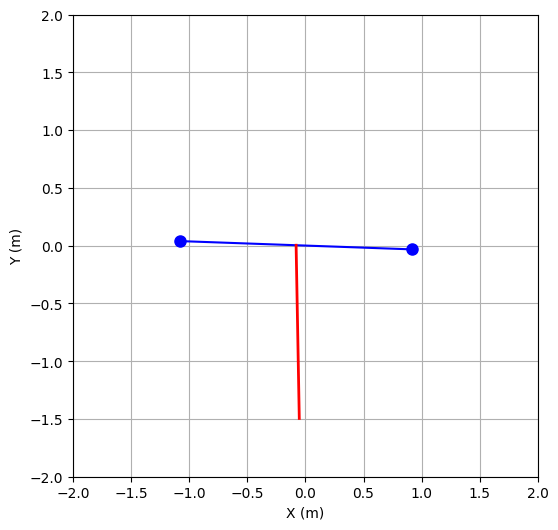

In [25]:
animate_dynamics(x_bar_cd)

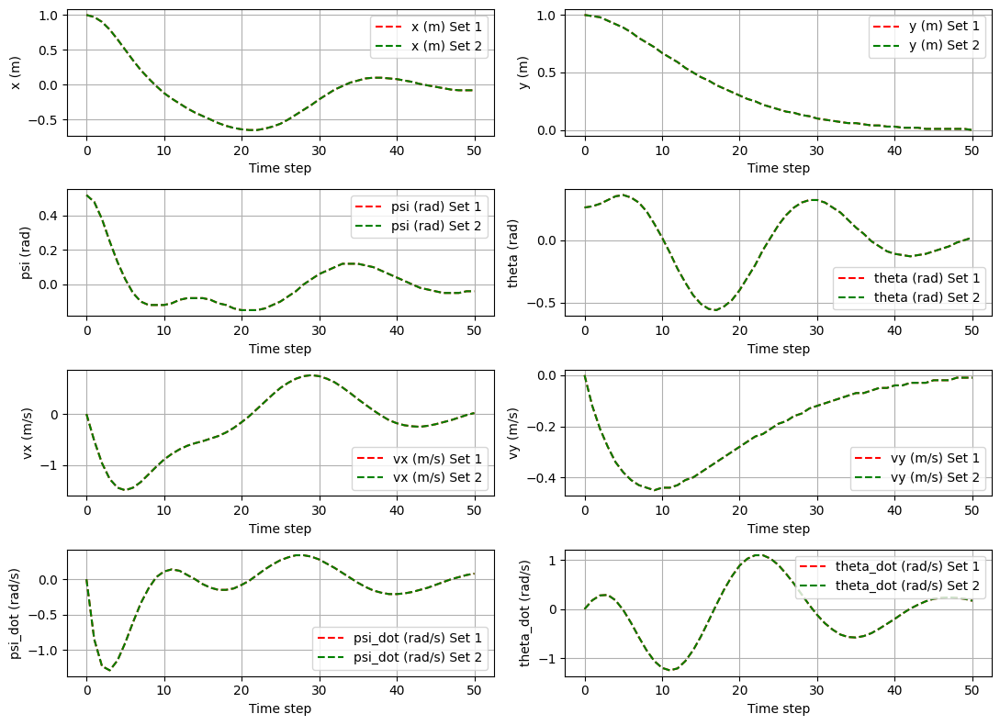

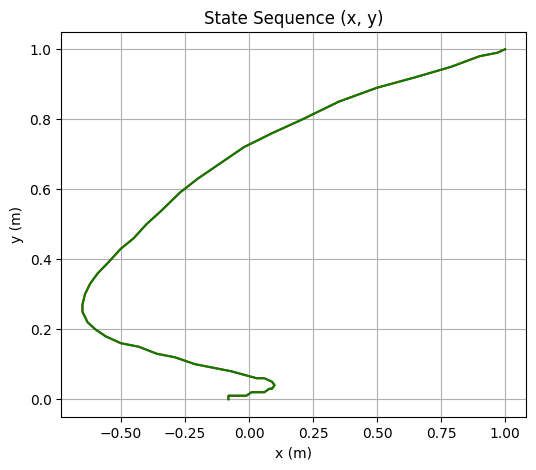

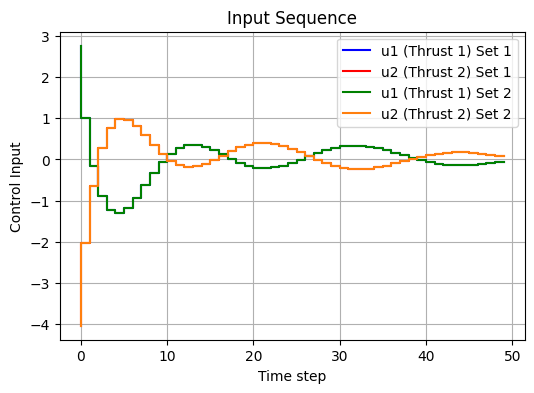

In [26]:
compare_results(N,x_bar_sp,u_bar_sp, x_bar_cd, u_bar_cd)

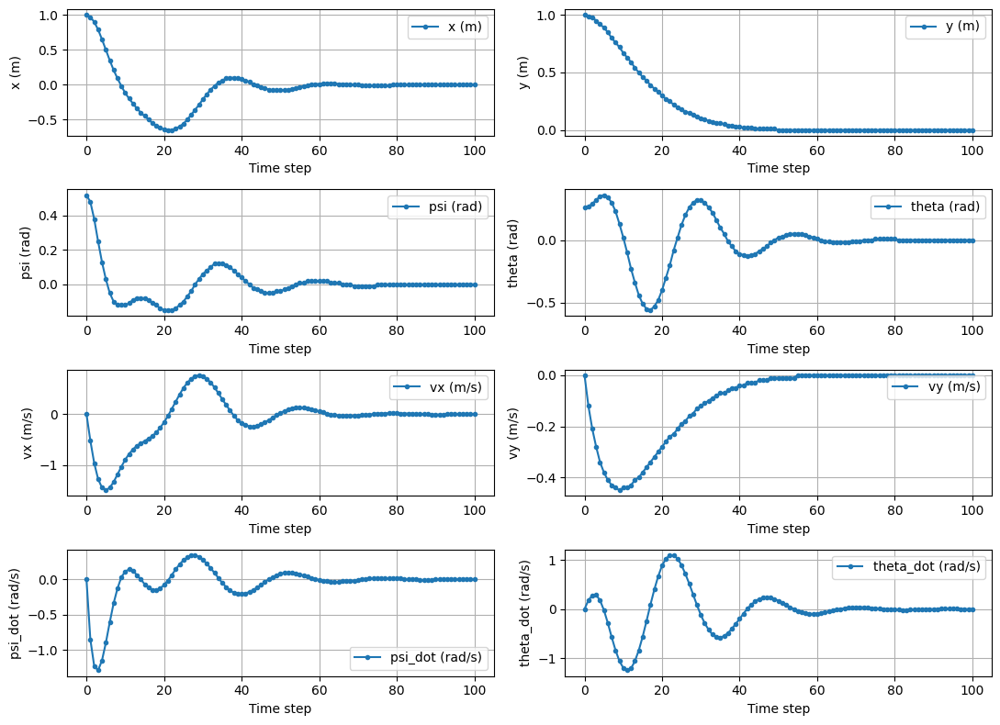

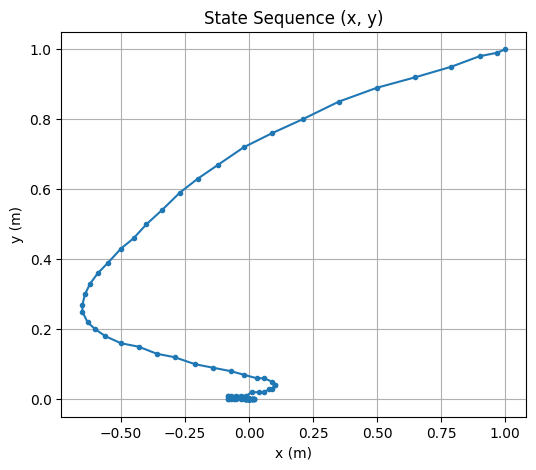

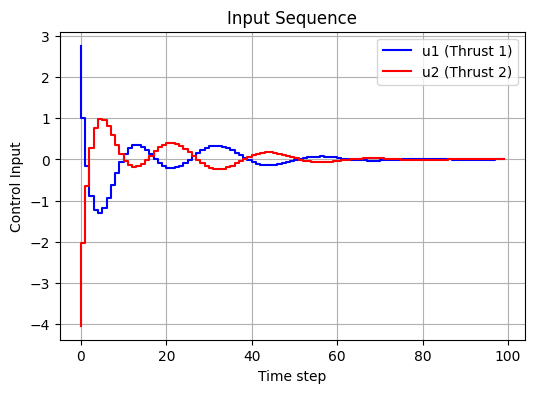

In [27]:
# Simulation parameters
timesteps = 100  # Total simulation time
N = 100  # MPC prediction horizon
dim_x = A_d.shape[0]
dim_u = B_d.shape[1]

Q = np.eye(dim_x_d)
R = np.eye(dim_u_d)

P_ric, _, K_ric = dare(A_d, B_d, Q, R)

# P = np.eye(dim_x_d)
P = P_ric

# Initial state
x0 = np.array([1, 1, np.pi/6, np.pi/12, 0, 0, 0, 0])

# Control input bounds
u_lb = np.array([-10, -10])
u_ub = np.array([10, 10])

# Store trajectories
x_traj_ol = np.zeros((timesteps + 1, dim_x))
u_traj_ol = np.zeros((timesteps, dim_u))
x_traj_ol[0] = x0

# Solve MPC once for the initial state to get the open-loop control sequence
x_bar, u_bar = solve_mpc_condensed(A_d, B_d, Q, R, P, x0, N, u_lb, u_ub)

# Apply the entire control sequence in an open-loop fashion
x_k = x0
for k in range(timesteps):
    # Apply the control input at the current step (open-loop)
    if k < N:  # Use the control sequence calculated from MPC
        u_k = u_bar[k]
    else:  # After the horizon N, continue with the last control input
        u_k = u_bar[N-1]
        # u_k = np.array([0, 0])
    
    u_traj_ol[k] = u_k
    
    # Update the state using the system dynamics
    x_k = A_d @ x_k + B_d @ u_k
    x_traj_ol[k + 1] = x_k

plot_results(timesteps,x_traj_ol,u_traj_ol)

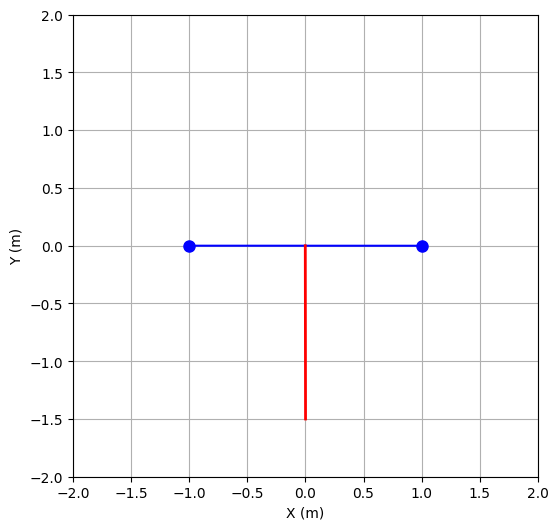

In [28]:
animate_dynamics(x_traj_ol)

## Closed loop trajectory

In [29]:
N = 50
Q = np.eye(dim_x_d)
R = np.eye(dim_u_d)
P_ric, _, K_ric = dare(A_d, B_d, Q, R)
# P = np.eye(dim_x_d)
P = P_ric
print("Solution to DARE: \n",np.round(P,1))
x0 = np.array([1,1,0,np.pi/12,0,0,0,0])

u_lb = np.array([-10, -10])
u_ub = np.array([10, 10])

N_sim = 100
x_traj_cl = np.zeros((N_sim + 1, dim_x_d))
u_traj_cl = np.zeros((N_sim, dim_u_d))
x_traj_cl[0, :] = x0

for t in range(N_sim): 
    # print(f"Time step: {t}")
    x_bar, u_bar = solve_mpc_condensed(A_d, B_d, Q, R, P, x_traj_cl[t, :], N, u_lb, u_ub)
    u0 = u_bar[0, :] # Take the first control input
    u_traj_cl[t, :] = u0
    x_traj_cl[t + 1, :] = A_d @ x_traj_cl[t, :] + B_d @ u0 # Forward simulation

Solution to DARE: 
 [[ 1.980e+01 -0.000e+00 -4.270e+01 -6.800e+00  1.360e+01 -0.000e+00
  -5.800e+00 -3.000e-01]
 [-0.000e+00  1.650e+01 -0.000e+00 -0.000e+00  0.000e+00  7.800e+00
   0.000e+00 -0.000e+00]
 [-4.270e+01 -0.000e+00  4.839e+02 -2.590e+01 -7.640e+01  0.000e+00
   8.540e+01  3.790e+01]
 [-6.800e+00 -0.000e+00 -2.590e+01  9.530e+01 -1.280e+01 -0.000e+00
  -8.800e+00 -2.700e+00]
 [ 1.360e+01  0.000e+00 -7.640e+01 -1.280e+01  2.160e+01 -0.000e+00
  -1.120e+01 -2.200e+00]
 [-0.000e+00  7.800e+00  0.000e+00 -0.000e+00 -0.000e+00  1.300e+01
   0.000e+00  0.000e+00]
 [-5.800e+00  0.000e+00  8.540e+01 -8.800e+00 -1.120e+01  0.000e+00
   2.480e+01  4.000e+00]
 [-3.000e-01 -0.000e+00  3.790e+01 -2.700e+00 -2.200e+00  0.000e+00
   4.000e+00  1.490e+01]]


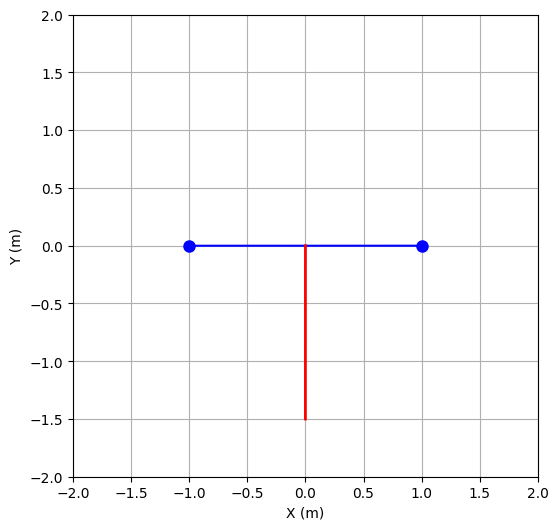

In [30]:
animate_dynamics(x_traj_cl)

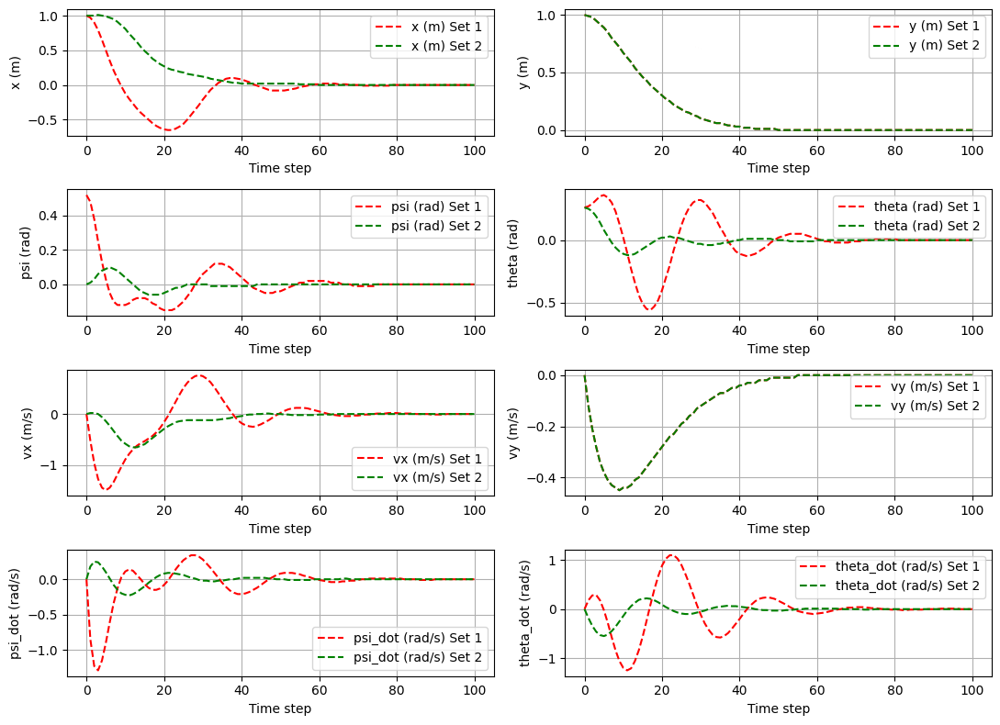

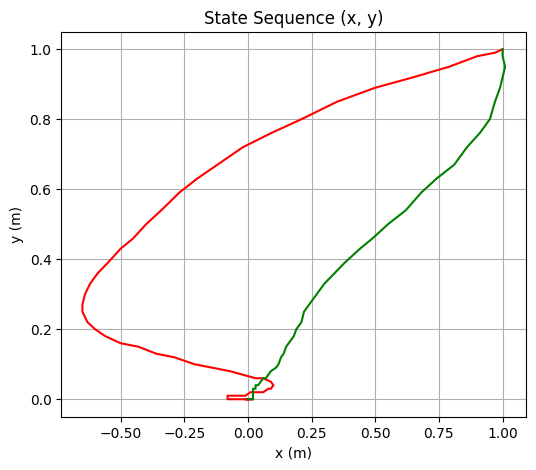

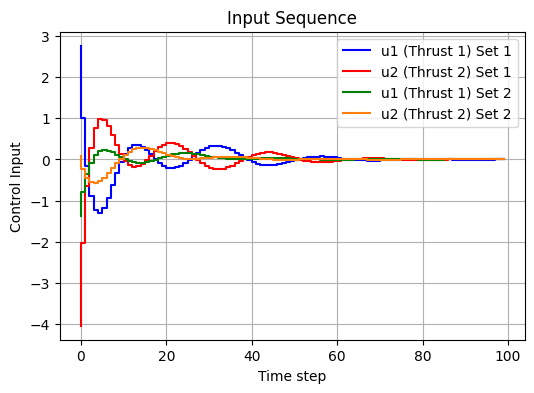

In [31]:
compare_results(N_sim,x_traj_ol,u_traj_ol, x_traj_cl, u_traj_cl)

In [32]:
N = 50
Q = np.eye(dim_x_d)
R = np.eye(dim_u_d)
# P_ric, _, K_ric = dare(A_d, B_d, Q, R)
P = np.eye(dim_x_d)
# P = P_ric
# print("Solution to DARE: \n",np.round(P,1))
x0 = np.array([1,1,0,np.pi/12,0,0,0,0])

u_lb = np.array([-10, -10])
u_ub = np.array([10, 10])

N_sim = 100
x_traj_cl_wo_ric = np.zeros((N_sim + 1, dim_x_d))
u_traj_cl_wo_ric = np.zeros((N_sim, dim_u_d))
x_traj_cl_wo_ric[0, :] = x0

for t in range(N_sim): 
    # print(f"Time step: {t}")
    x_bar, u_bar = solve_mpc_condensed(A_d, B_d, Q, R, P, x_traj_cl_wo_ric[t, :], N, u_lb, u_ub)
    u0 = u_bar[0, :] # Take the first control input
    u_traj_cl_wo_ric[t, :] = u0
    x_traj_cl_wo_ric[t + 1, :] = A_d @ x_traj_cl_wo_ric[t, :] + B_d @ u0 # Forward simulation

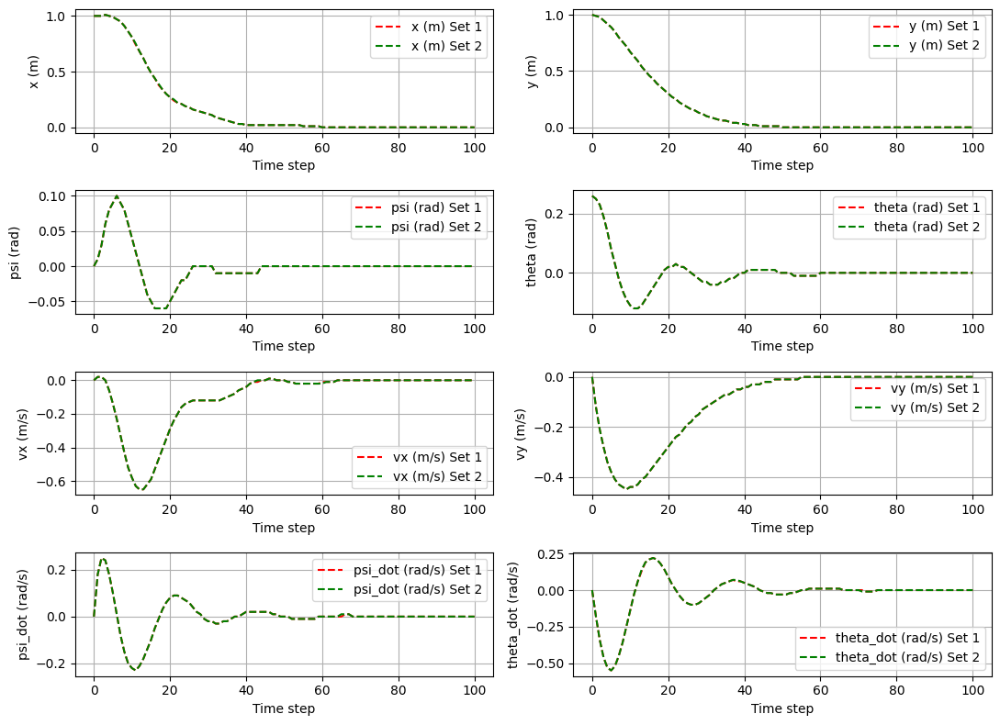

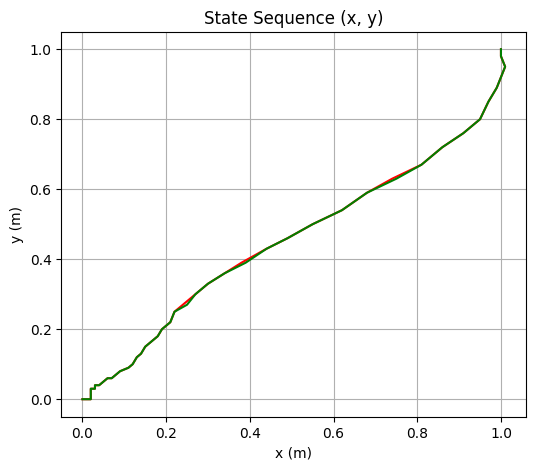

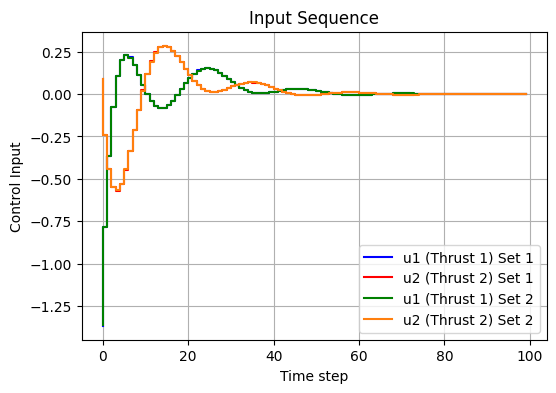

In [33]:
compare_results(N_sim, x_traj_cl, u_traj_cl, x_traj_cl_wo_ric, u_traj_cl_wo_ric)

## Computing the projection of $\mathbb{Z}$ onto $\mathcal{X}_N$

In [34]:
N = 2
dim_x = A_d.shape[0]
dim_u = B_d.shape[1]

T, S = gen_prediction_matrices(A_d, B_d, N)
print(f"T:\n {T}")
print(f"S:\n {S}")


A = np.array([[0,0,1,0,0,0,0,0],
              [0,0,0,1,0,0,0,0]])
b = np.array([[np.pi/2],[np.pi/3]])

C = np.array([[1.], [-1.]])
d = np.array([[1.],[1.]])

A_bar = np.kron(np.eye(N + 1), A)
b_bar = np.kron(np.ones((N + 1, 1)), b)
# C_bar = np.kron(np.eye(N), C)
C_bar = np.kron(np.eye(N), np.hstack([C] * dim_u))
d_bar = np.kron(np.ones((N, 1)), d)

# Compute G, H, psi
G = A_bar @ T
G = np.vstack([G, np.zeros((C_bar.shape[0], dim_x))])
H = np.vstack((A_bar @ S, C_bar))
psi = -np.vstack((b_bar, d_bar))


G = A_bar @ T
G = np.vstack([G, np.zeros((C_bar.shape[0], dim_x))])
H = np.vstack((A_bar @ S, C_bar))
psi = -np.vstack((b_bar, d_bar))

print(f"G:\n {G}")
print(f"H:\n {H}")
print(f"psi:\n {psi}")

T:
 [[ 1.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  1.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   1.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  1.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00

Next, we compute $\mathcal{X}_2 \coloneqq \left\{x(0) \in \R^8 \mid \exists \boldsymbol{u} \in \R^8 \text{ s.t. } (x(0), \boldsymbol{u}) \in \mathbb{Z} \right\} = \left\{x(0) \in \R^8 \mid P x(0) + \gamma \leq 0 \right\}$ by iteratively elimiating control inputs. This method is known as Fourier–Motzkin elimination (https://en.wikipedia.org/wiki/Fourier%E2%80%93Motzkin_elimination).

In [35]:
def remove_zero_rows(A, b):
    """
    Removes rows of A that are all zeros and the corresponding elements in b.
    """
    keeprows = np.any(A, axis=1)
    A = A[keeprows, :]
    b = b[keeprows]
    
    return A, b 

def proj_single_input(G, H, psi):
    # Define the sets by basing on the i-th column of H
   
    I_0 = np.where(H == 0)[0]
    I_p = np.where(H > 0)[0]
    I_m = np.where(H < 0)[0]

    # Set the row of matrix [P gamma]

    # Define C    
    C = np.hstack((G, psi))

    # Define row by row [P gamma]
    aux = []
    for i in I_0:
        aux.append(C[i])

    for i in I_p:
        for j in I_m:
            aux.append(H[i]*C[j] - H[j]*C[i])

    # Return the desired matrix/vector
    aux = np.array(aux)
    P = aux[:,:-1]
    gamma = aux[:,[-1]]
    
    P, gamma = remove_zero_rows(P, gamma)

    return P, gamma

def proj_input(G, H, psi, N, dim_u):
    G_i = np.hstack((G, H[:,:-1]))
    H_i = H[:,-1]
    psi_i = psi

    for i in range(N * dim_u, 0, -1):
        P_i, gamma_i = proj_single_input(G_i, H_i, psi_i)

        G_i = P_i[:,:-1]
        H_i = P_i[:,-1]
        psi_i = gamma_i

    return P_i, gamma_i


P, gamma = proj_input(G, H, psi, N, dim_u)

print(f"P:\n {P}")
print(f"gamma:\n {gamma}")

P:
 [[0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0.]]
gamma:
 [[-1.57079633]
 [-1.04719755]]


## Terminal constraint and region of attraction

$$
V(x(0),\boldsymbol{u})=\frac{1}{2}\sum_{k=0}^{N-1}  x(k)^\top Q x(k)+u(k)^\top R u(k) + V_{ \textup{f} }(x(N)),
$$
where $x(0) = x_0$ , $Q = \alpha I_2$ and $R = I_2$.

Set $N = 3$ and implement the MPC with no terminal cost ($V_{ \textup{f}}(x(N)) = 0$) for $\alpha = 0.2$.

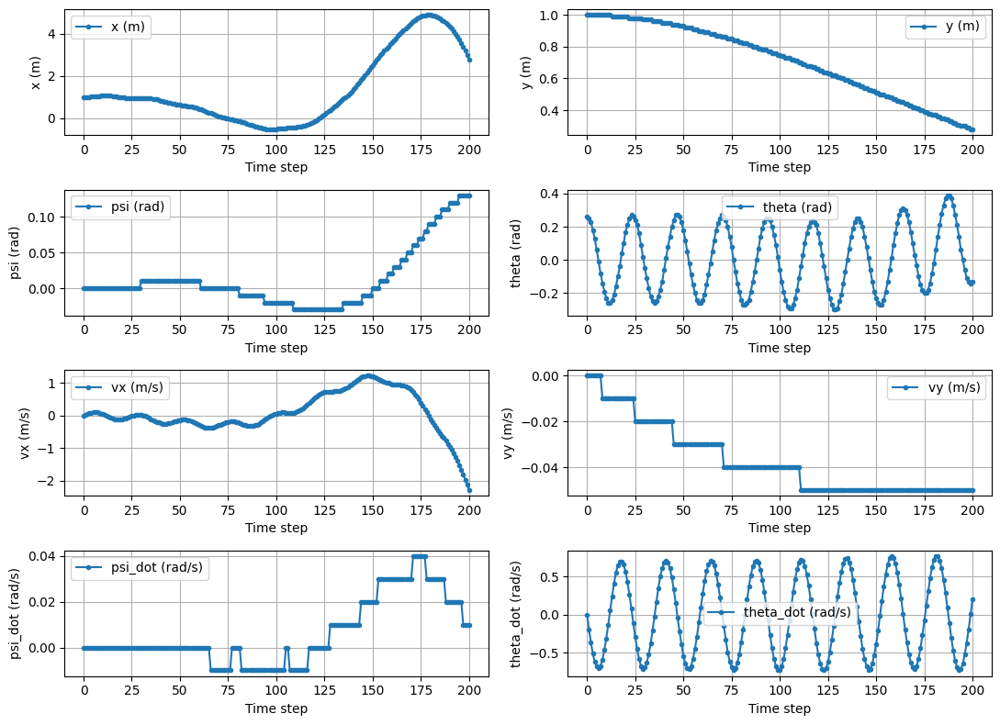

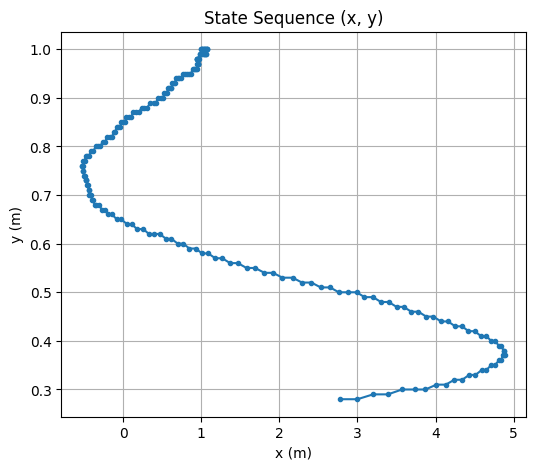

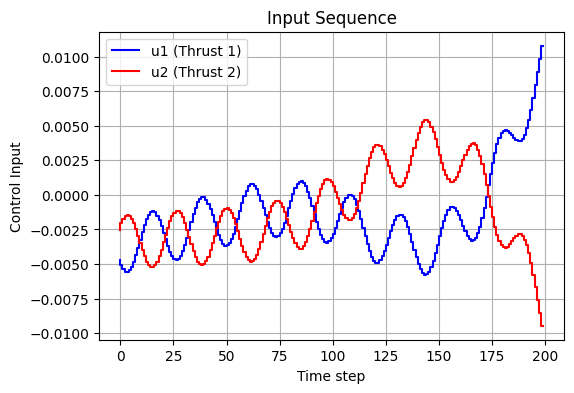

In [36]:
N = 3
dim_x = A_d.shape[0]
dim_u = B_d.shape[1]

alpha = 0.2
Q = alpha*np.eye(dim_x_d)
R = np.eye(dim_u_d)
# P_ric, _, K_ric = dare(A_d, B_d, Q, R)
# P = np.eye(dim_x_d)
P = np.zeros((dim_x_d, dim_x_d))
# P = P_ric
# print("Solution to DARE: \n",np.round(P,1))


x0 = np.array([1,1,0,np.pi/12,0,0,0,0])

u_lb = np.array([-10., -10.])
u_ub = np.array([ 10.,  10.])

D = np.array([[0,0,1,0,0,0,0,0],
              [0,0,0,1,0,0,0,0]])

c_lb = np.array([-np.inf, -np.inf])
c_ub = np.array([5.,       np.inf])

N_sim = 200
x_hist = np.zeros((N_sim + 1, dim_x))
u_hist = np.zeros((N_sim, dim_u))
x_hist[0, :] = x0

for t in range(N_sim):
    x_bar, u_bar = solve_condensed_mpc(x_hist[t, :], A_d, B_d, Q, R, P, N, u_lb, u_ub, D, c_lb, c_ub)
    x_hist[t + 1, :] = A_d @ x_hist[t, :] + B_d @ u_bar[0, :]
    u_hist[t, :] = u_bar[0, :]

plot_results(N_sim, x_hist, u_hist)

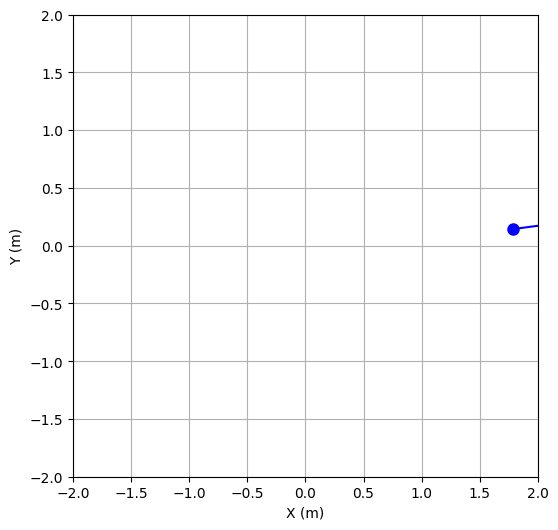

In [37]:
animate_dynamics(x_hist)

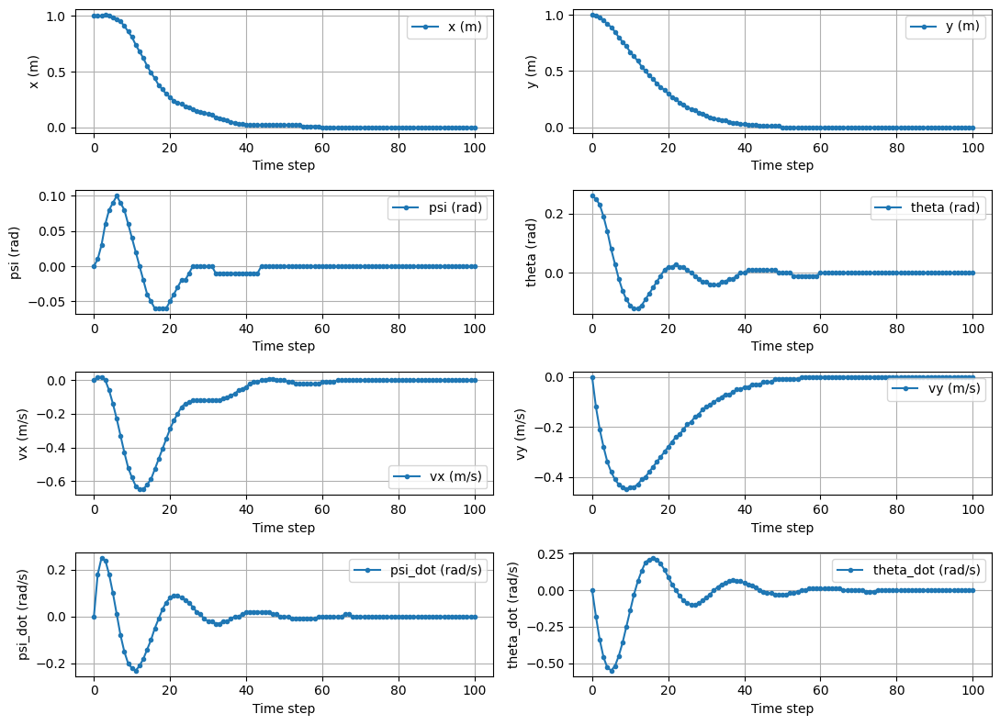

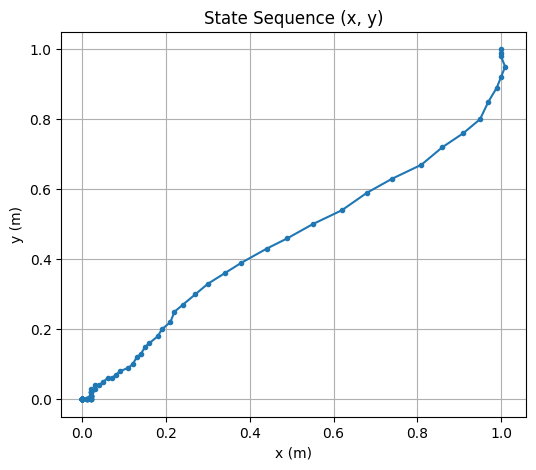

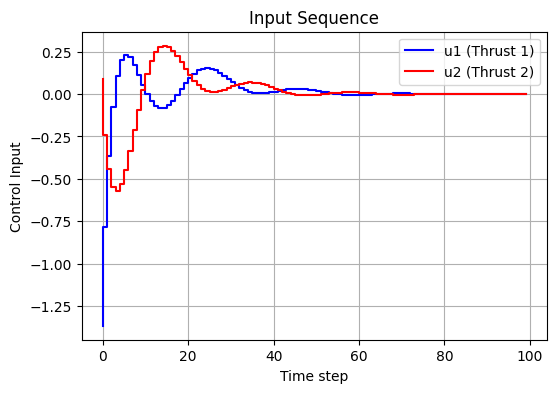

In [38]:
N = 3
dim_x = A_d.shape[0]
dim_u = B_d.shape[1]

alpha = 1
Q = alpha*np.eye(dim_x_d)
# R = np.eye(dim_u_d)
P_ric, _, K_ric = dare(A_d, B_d, Q, R)
# P = np.eye(dim_x_d)
# P = np.zeros((dim_x_d, dim_x_d))
P = P_ric
# print("Solution to DARE: \n",np.round(P,1))


x0 = np.array([1,1,0,np.pi/12,0,0,0,0])

# Unconstrained inputs 
u_lb = np.array([-np.inf, -np.inf])
u_ub = np.array([np.inf,  np.inf])

# Constrained inputs 
# u_lb = np.array([-1, -1])
# u_ub = np.array([ 1,  1])

# D = np.array([[0,0,1,0,0,0,0,0],
#               [0,0,0,1,0,0,0,0]])

D = np.array([[1,0,0,0,0,0,0,0],
              [0,1,0,0,0,0,0,0]])

c_lb = np.array([-2, -2])
c_ub = np.array([2, 2])

N_sim = 100
x_hist = np.zeros((N_sim + 1, dim_x))
u_hist = np.zeros((N_sim, dim_u))
x_hist[0, :] = x0

for t in range(N_sim):
    x_bar, u_bar = solve_condensed_mpc(x_hist[t, :], A_d, B_d, Q, R, P, N, u_lb, u_ub, D, c_lb, c_ub)
    x_hist[t + 1, :] = A_d @ x_hist[t, :] + B_d @ u_bar[0, :]
    u_hist[t, :] = u_bar[0, :]

plot_results(N_sim, x_hist, u_hist)

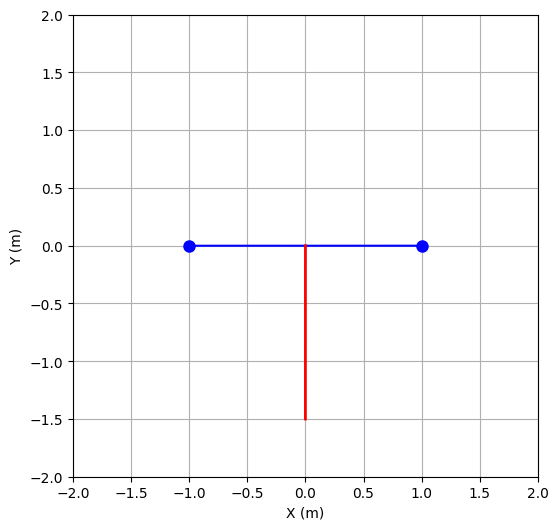

In [39]:
animate_dynamics(x_hist)

## Find the region of attraction for the constrained MPC controller using the projection algorithm.

In [40]:

# N = 3
# dim_x = A_d.shape[0]
# dim_u = B_d.shape[1]

# u_lb = np.array([-1., -1.])
# u_ub = np.array([ 1.,  1.])

# T, S = gen_prediction_matrices(A_d, B_d, N)

# print(T.shape,S.shape)
# Gx = np.array([
#     [1., 0.]
# ])
# # print(Gx)
# print(Gx.shape)

# gx = np.array([5.])
# Gx_bar = np.kron(np.eye(N), Gx)

# print(Gx_bar.shape)
# # # print(Gx_bar)

# gx_bar = np.kron(np.ones(N), gx)

# print(gx_bar.shape)

# # Gx_bar = sp.linalg.block_diag(Gx_bar, 
# #                               np.vstack((np.eye(dim_x), -np.eye(dim_x)))
# # )

# # print(Gx_bar)

# # gx_bar = np.hstack((gx_bar, np.zeros(2 * dim_x)))

# # # print(gx_bar.shape)

# # Iu = np.eye(dim_u)
# # Gu = np.vstack((Iu, -Iu))
# # gu = np.hstack((u_ub, -u_lb))

# # Gu_bar = np.kron(np.eye(N), Gu)
# # gu_bar = np.kron(np.ones(N), gu)

# # G = Gx_bar @ T
# # print(G.shape)

# # G = np.vstack([G, np.zeros((Gu_bar.shape[0], dim_x))])
# # print(G.shape)
# # H = np.vstack((Gx_bar @ S, Gu_bar))
# # psi = -np.hstack((gx_bar, gu_bar))
# # psi = psi.reshape((-1, 1))  # TODO:

# # print(G,H,psi)
# # P, gamma = proj_input(G, H, psi, N, dim_u)

# # print(f"P:\n {P}")
# # print(f"gamma:\n {gamma}")

In [41]:
# import numpy as np
# import cvxpy as cp
# import polytope as pc
# import matplotlib.pyplot as plt
# from scipy.spatial import ConvexHull

# # Define system matrices (example)
# A = np.random.randn(8, 8)  # Replace with actual A
# B = np.random.randn(8, 2)  # Replace with actual B (assuming 2 inputs)
# nx, nu = B.shape

# # Define state and input constraints
# x_min = [-1,-1,-np.pi/6,np.pi/6, -1,-1, -np.pi/6, -np.pi/6] # Example constraints
# x_max = np.ones(nx) * 5
# u_min = -np.ones(nu) * 1
# u_max = np.ones(nu) * 1

# # Define prediction horizon
# N = 10

# # Monte Carlo Sampling for State Space
# num_samples = 5000  # Adjust for accuracy vs computation time
# x_samples = np.random.uniform(x_min, x_max, (num_samples, nx))
# feasible_states = []

# # Feasibility Check for Each Sampled State
# for x0 in x_samples:
#     U = cp.Variable((nu, N))
#     constraints = []
#     x_k = x0

#     for k in range(N):
#         u_k = U[:, k]
#         x_k = A @ x_k + B @ u_k
#         constraints += [x_min <= x_k, x_k <= x_max, u_min <= u_k, u_k <= u_max]

#     prob = cp.Problem(cp.Minimize(0), constraints)
#     if prob.solve(solver=cp.CVXOPT, verbose=False) is not None:
#         feasible_states.append(x0)

# # Convert Feasible States into a Convex Hull Approximation
# feasible_states = np.array(feasible_states)
# hull = ConvexHull(feasible_states)

# # Visualizing the Feasible Set (for 2D Projections)
# plt.figure(figsize=(6, 6))
# plt.scatter(feasible_states[:, 0], feasible_states[:, 1], s=5, alpha=0.5)
# plt.xlabel("x1")
# plt.ylabel("x2")
# plt.title("Feasible Set (Projected)")
# plt.grid()
# plt.show()


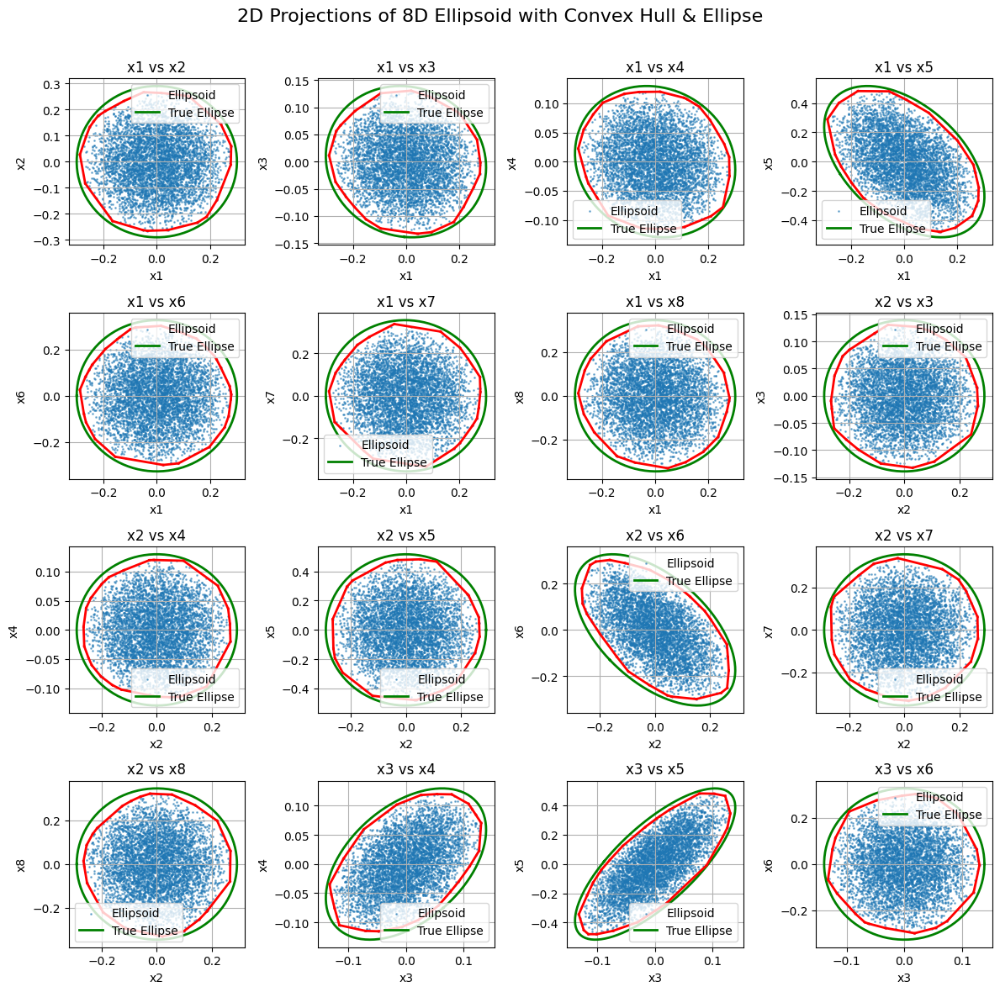

In [18]:
import numpy as np
import scipy.linalg
import matplotlib.pyplot as plt
import itertools
from scipy.spatial import ConvexHull

# Define system (replace with actual values)
np.random.seed(42)  # For reproducibility
A = A_d  # 8x8 system matrix
B = B_d  # 8x2 input matrix
Q = np.eye(8)  # State cost matrix
R = np.eye(2)  # Input cost matrix

# Solve Discrete Algebraic Riccati Equation (DARE)
P = scipy.linalg.solve_discrete_are(A, B, Q, R)

# Define level set gamma (adjustable)
gamma = 1  

# Sample points on an 8D unit sphere
num_samples = 5000  # Adjust for accuracy vs computation time
sphere_points = np.random.randn(num_samples, 8)
sphere_points /= np.linalg.norm(sphere_points, axis=1, keepdims=True)  # Normalize to unit sphere

# Map unit sphere to ellipsoid using Cholesky factorization
L = np.linalg.cholesky(np.linalg.inv(P))  # Transform unit sphere to ellipsoid
ellipsoid_points = np.sqrt(gamma) * sphere_points @ L.T  # Scale and rotate

# Generate fine points for actual 2D ellipses
theta = np.linspace(0, 2 * np.pi, 100)

# Plot all 2D projections (scatter plots with convex hull overapproximation and ellipse)
state_indices = range(8)  # State indices (0 to 7)
pairs = list(itertools.combinations(state_indices, 2))  # All 2D pairs

fig, axes = plt.subplots(4, 4, figsize=(12, 12))  # Create subplots
fig.suptitle("2D Projections of 8D Ellipsoid with Convex Hull & Ellipse", fontsize=16)

for ax, (i, j) in zip(axes.flatten(), pairs):
    # Plot ellipsoid points
    ax.scatter(ellipsoid_points[:, i], ellipsoid_points[:, j], s=1, alpha=0.5, label="Ellipsoid")

    # Compute and plot true ellipse in (xi, xj) plane
    eigvals, eigvecs = np.linalg.eigh(np.linalg.inv(P)[[i, j], :][:, [i, j]])  # Extract 2D submatrix
    ellipse_points = np.array([
        np.sqrt(gamma) * eigvecs @ (np.sqrt(eigvals) * np.array([np.cos(t), np.sin(t)]))
        for t in theta
    ])
    ax.plot(ellipse_points[:, 0], ellipse_points[:, 1], 'g-', linewidth=2, label="True Ellipse")

    # Compute convex hull of the 2D projection of the ellipsoid points
    points_2d = ellipsoid_points[:, [i, j]]
    hull = ConvexHull(points_2d)

    # Plot convex hull (polygon)
    for simplex in hull.simplices:
        ax.plot(points_2d[simplex, 0], points_2d[simplex, 1], 'r-', linewidth=2)

    # Labels and titles
    ax.set_xlabel(f"x{i+1}")
    ax.set_ylabel(f"x{j+1}")
    ax.set_title(f"x{i+1} vs x{j+1}")
    ax.legend()
    ax.grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout
plt.show()


## Compute the infinite horizon optimal cost and control law for the unconstrained system

In [41]:
N = 3
dim_x = A_d.shape[0]
dim_u = B_d.shape[1]

alpha = 10e-5
Q = alpha * np.eye(dim_x)
R = np.eye(dim_u)
P = np.zeros((dim_x, dim_x))

P_inf, _, K_inf = dare(A_d, B_d, Q, R)
K_inf = -K_inf
print(f"P_inf:\n {P_inf}")
print(f"K_inf:\n {K_inf}")

P_inf:
 [[ 4.29846746e-03 -3.70742826e-18 -9.84279604e-02  1.43978850e-03
   8.52348788e-03  1.41826999e-17 -5.66398287e-02  8.99884229e-04]
 [-3.70742826e-18  1.25626346e-02 -8.71254222e-17  1.94397736e-16
  -9.08180459e-17  7.77817620e-02 -1.20339594e-16 -1.72002534e-16]
 [-9.84279604e-02 -8.71254222e-17  6.40408012e+00 -5.35900231e-01
  -3.61447910e-01 -6.00183932e-16  4.84048444e+00 -3.41093197e-02]
 [ 1.43978850e-03  1.94397736e-16 -5.35900231e-01  4.41846444e-01
   5.21461686e-03  3.17782797e-15 -1.07477322e-01  5.40203662e-04]
 [ 8.52348788e-03 -9.08180459e-17 -3.61447910e-01  5.21461686e-03
   2.63750971e-02 -1.13242323e-15 -2.40550444e-01  2.67388358e-03]
 [ 1.41826999e-17  7.77817620e-02 -6.00183932e-16  3.17782797e-15
  -1.13242323e-15  9.73304765e-01 -8.60388922e-16 -1.99420837e-15]
 [-5.66398287e-02 -1.20339594e-16  4.84048444e+00 -1.07477322e-01
  -2.40550444e-01 -8.60388922e-16  5.56798074e+00 -8.13940054e-02]
 [ 8.99884229e-04 -1.72002534e-16 -3.41093197e-02  5.40203662

## Compute $\mathbb{X}_f$

In [42]:
def compute_maximal_admissible_set(F, A, b, max_iter=100):
    '''
    Compute the maximal admissible set for the system x_{t+1} = F x_t subject to A x_t <= b.
    
    Note that if F is unstable, this procedure will not work.
    '''
    
    dim_con = A.shape[0]
    A_inf_hist = []
    b_inf_hist = []

    Ft = F
    A_inf = A
    b_inf = b
    A_inf_hist.append(A_inf)
    b_inf_hist.append(b_inf)

    for t in range(max_iter):
        f_obj = A @ Ft
        stop_flag = True
        for i in range(dim_con):
            x = linprog(-f_obj[i], A_ub=A_inf, b_ub=b_inf, method="highs")["x"]
            # x = solve_qp(np.zeros((2, 2)), -f_obj[i], A_inf, b_inf, solver="") # Actually, this is not a QP, but a LP. It is better to use a LP solver.
            if f_obj[i] @ x > b[i]:
                stop_flag = False
                break

        if stop_flag:
            break
        
        A_inf = np.vstack((A_inf, A @ Ft))
        b_inf = np.hstack((b_inf, b))
        Ft = F @ Ft
        A_inf_hist.append(A_inf)
        b_inf_hist.append(b_inf)

    return A_inf_hist, b_inf_hist

def find_lqr_invariant_set(A, B, K, lb_x, ub_x, lb_u, ub_u):
    A_x, b_x = box_constraints(lb_x, ub_x)
    A_u, b_u = box_constraints(lb_u, ub_u)

    A_lqr = A_u @ K
    b_lqr = b_u

    A_con = np.vstack((A_lqr, A_x))
    b_con = np.hstack((b_lqr, b_x))

    F = A + B @ K
    
    A_inf_hist, b_inf_hist = compute_maximal_admissible_set(F, A_con, b_con)

    return A_inf_hist, b_inf_hist

In [43]:
def remove_redundant_constraints(A, b, x0=None, tol=None):
    """
    Removes redundant constraints for the polyhedron Ax <= b.
    """
    print("Initial A:", A)
    print("Initial b:", b)
    
    if A.shape[0] != b.shape[0]:
        raise ValueError("A and b must have the same number of rows!")
    
    if tol is None:
        tol = 1e-8 * max(1, np.linalg.norm(b) / len(b))
    elif tol <= 0:
        raise ValueError("tol must be strictly positive!")
    print("Tolerance:", tol)
     
    # Remove zero rows in A
    Anorms = np.max(np.abs(A), axis=1)
    badrows = (Anorms == 0)
    print("Zero rows in A:", badrows)
    
    if np.any(b[badrows] < 0):
        raise ValueError("A has infeasible trivial rows.")
        
    A = A[~badrows, :]
    b = b[~badrows]
    goodrows = np.concatenate(([0], np.where(~badrows)[0]))
    print("Filtered A:", A)
    print("Filtered b:", b)
    print("Good rows indices:", goodrows)
    
    # Find an interior point if not supplied
    if x0 is None:
        if np.all(b > 0):
            x0 = np.zeros(A.shape[1])
        else:
            raise ValueError("Must supply an interior point!")
    else:
        x0 = np.asarray(x0).flatten()
        if x0.shape[0] != A.shape[1]:
            raise ValueError("x0 must have as many entries as A has columns.")
        if np.any(A @ x0 >= b - tol):
            raise ValueError("x0 is not in the strict interior of Ax <= b!")
    print("Interior point x0:", x0)
    
    # Compute convex hull after projection
    btilde = b - A @ x0
    print("Shifted btilde:", btilde)
    
    if np.any(btilde <= 0):
        print("Warning: Shifted b is not strictly positive. Convex hull may fail.")
    
    Atilde = np.vstack((np.zeros((1, A.shape[1])), A / btilde[:, np.newaxis]))
    print("Transformed Atilde:", Atilde)
    print("Transformed Atilde Shape:", Atilde.shape)
    
    hull = ConvexHull(Atilde)    
    u = np.unique(hull.vertices)    
    nr = goodrows[u]    
    h = goodrows[hull.simplices]
    
    print("Unique non-redundant row indices:", nr)
    print("Hull simplices:", h)
    
    Anr = A[nr, :]
    bnr = b[nr]
    
    print("Final reduced A:", Anr)
    print("Final reduced b:", bnr)
    
    return nr, Anr, bnr, h, x0

In [44]:
def box_constraints(lb, ub):
    num_con = 2 * len(lb)
    A = np.kron(np.eye(len(lb)), [[1], [-1]])

    b = np.zeros(num_con)
    for i in range(num_con):
        b[i] = ub[i // 2] if i % 2 == 0 else -lb[i // 2]

    goodrows = np.logical_and(~np.isinf(b), ~np.isnan(b))
    A = A[goodrows]
    b = b[goodrows]
    
    return A, b

N = 3
dim_x = A_d.shape[0]
dim_u = B_d.shape[1]

alpha = 10e-5
Q = alpha * np.eye(dim_x)
R = np.eye(dim_u)
P = np.zeros((dim_x, dim_x))


P_inf, _, K_inf = dare(A_d, B_d, Q, R)
K_inf = -K_inf
# print(f"P_inf:\n {P_inf}")
# print(f"K_inf:\n {K_inf}")

K = K_inf

lb_x = [-3, -3,-np.pi/6, -np.pi/6, -3, -3, -np.pi/12,-np.pi/12]
ub_x = [3, 3, np.pi/6, np.pi/6, 3, 3, np.pi/12, np.pi/12]

# lb_x = [-1, -1,-np.pi/12, -np.pi/12, -2, -2, -np.pi/6,-np.pi/6]
# ub_x = [-1, -1,-np.pi/12, -np.pi/12, -2, -2, -np.pi/6,-np.pi/6]

lb_u = [-3, -3]
ub_u = [3, 3]

A_x, b_x = box_constraints(lb_x, ub_x)
A_u, b_u = box_constraints(lb_u, ub_u)

# print(f"A_x:\n {A_x} \n b_x: \n {b_x}")
# print(f"A_u:\n {A_u} \n b_u: \n {b_u}")

A_lqr = A_u @ K
b_lqr = b_u

# print(f"A_lqr:\n {A_lqr}")
# print(f"b_lqr:\n {b_lqr}")

A_con = np.vstack((A_lqr, A_x))
b_con = np.hstack((b_lqr, b_x))

A_inf_hist, b_inf_hist = find_lqr_invariant_set(A_d, B_d, K, lb_x, ub_x, lb_u, ub_u)

# print(f"A_inf_hist:\n {A_inf_hist[-1]} \n b_inf_hist: \n {b_inf_hist[-1]}")

# _, A_inf, b_inf, _, _ = remove_redundant_constraints(A_inf_hist[-1], b_inf_hist[-1])

# print(f"A_inf:\n{A_inf}")
# print(f"b_inf:\n{b_inf}")

In [45]:
# with open('test.npy', 'wb') as f:
#     np.save(f, A_inf)
#     np.save(f, b_inf)

In [46]:
with open('test.npy', 'rb') as f:
    A_inf = np.load(f)
    b_inf = np.load(f)

In [47]:
def find_feasible_point(A, b):
    """Finds an interior point of the polytope A x ≤ b using linear programming."""
    c = np.zeros(A.shape[1])  # Objective function (zero since we just need feasibility)
    res = linprog(c, A_ub=A, b_ub=b, method='highs')  
    if res.success:
        return res.x
    else:
        raise ValueError("Could not find a feasible point. Check constraints.")

def plot_polygon(A, b, state_indices=(0, 1)):
    '''
    Visualize the polytope defined by A x <= b, projected onto any two selected states.
    
    Parameters:
    - A: Constraint matrix (m x n), where n = 8 (state dimension)
    - b: Constraint vector (m,)
    - state_indices: Tuple (i, j), selecting two states (0-based indexing)
    '''
    i, j = state_indices  # Extract chosen state indices

    try:
        # Keep only the selected columns of A (project onto chosen states)
        A_proj = A[:, [i, j]]  
        
        # Find a feasible point in the full space
        feasible_point_full = find_feasible_point(A, b)
        feasible_point_proj = feasible_point_full[[i, j]]  # Project it onto the chosen states
        
        # Construct half-space representation for the selected states
        halfspaces = np.hstack((A_proj, -b[:, np.newaxis]))
        
        # Compute polytope intersection in the chosen state-space
        hs = HalfspaceIntersection(halfspaces, feasible_point_proj)
        polygon = Polygon(hs.intersections).convex_hull
        
        # Plot the projected polytope
        polygon_gpd = gpd.GeoSeries(polygon)
        polygon_gpd.plot(alpha=0.3, edgecolor='black')
        plt.plot(*polygon.exterior.xy, 'ro')
        plt.xlabel(f"$x_{i+1}$")  # LaTeX labels
        plt.ylabel(f"$x_{j+1}$")
        plt.title(f"Projection of Polytope onto ($x_{i+1}$, $x_{j+1}$)")
        plt.axis('equal')
        plt.grid()
        plt.show()
    
    except Exception as e:
        print(f"Error: {e}")

In [48]:
A_inf[:,:2]

array([[-0.00648243, -0.00701442],
       [ 0.00648243,  0.00701442],
       [ 0.00648243, -0.00701442],
       [-0.00648243,  0.00701442],
       [ 1.        ,  0.        ],
       [-1.        , -0.        ],
       [ 0.        ,  1.        ],
       [-0.        , -1.        ],
       [ 0.        ,  0.        ],
       [-0.        , -0.        ],
       [ 0.        ,  0.        ],
       [-0.        , -0.        ],
       [ 0.        ,  0.        ],
       [-0.        , -0.        ],
       [ 0.        ,  0.        ],
       [-0.        , -0.        ],
       [ 0.        ,  0.        ],
       [-0.        , -0.        ],
       [ 0.        ,  0.        ],
       [-0.        , -0.        ]])

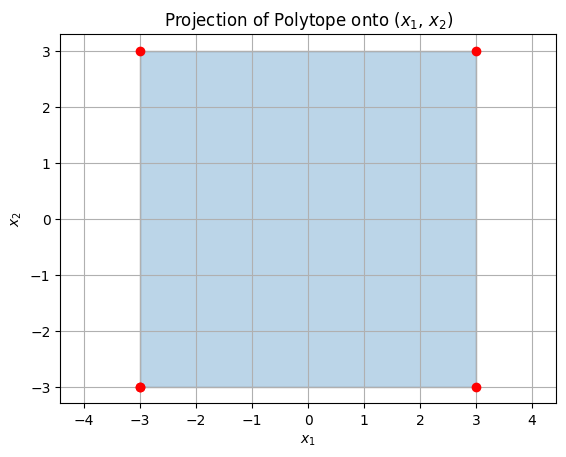

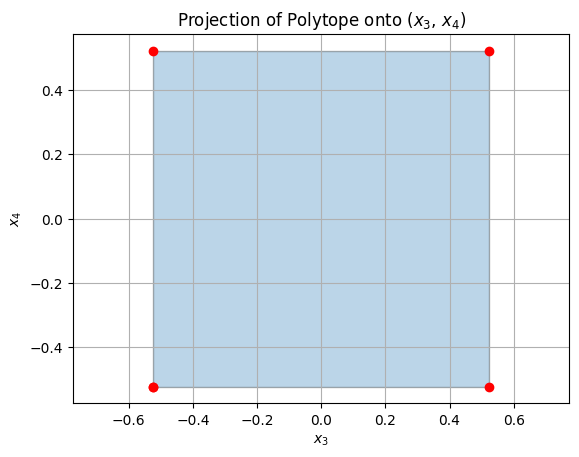

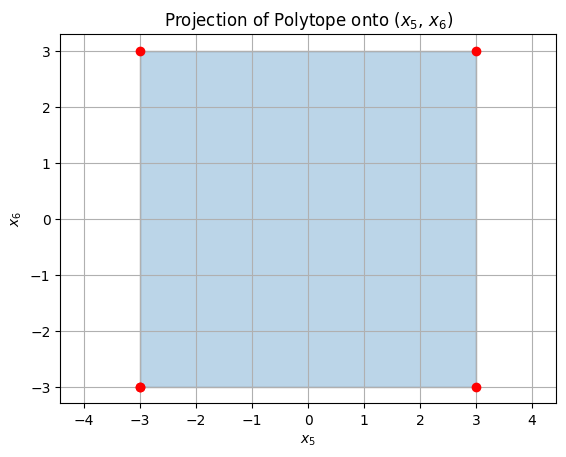

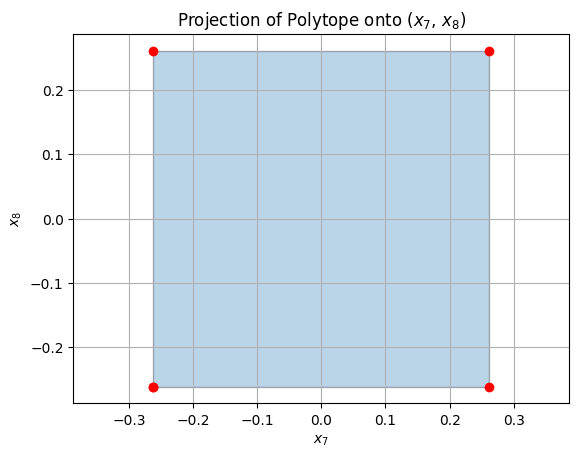

In [49]:
# Visualize different state pairs
plot_polygon(A_inf, b_inf, state_indices=(0, 1))  # (x1, x2)
plot_polygon(A_inf, b_inf, state_indices=(2, 3))  # (x3, x4)
plot_polygon(A_inf, b_inf, state_indices=(4, 5))  # (x5, x6)
plot_polygon(A_inf, b_inf, state_indices=(6, 7))  # (x6, x7)

## Compute $\mathcal{X}_N$

We first compute the feasible set $\mathcal{X}_1$ for the system $x^+ = Ax + Bu$ subject to constraints $Gx + Hu + \psi <= 0$ and $x^+ \in \mathcal{X}_f$. The feasible set $\mathcal{X}_2$ is then caculated based on $\mathcal{X}_1$. This process is repeated iteratively until we obtain $\mathcal{X}_N$.

In [50]:
def computeX1(G, H, psi, Ad, Bd, P, gamma): # TODO: Add support for the point constraint 
    '''
    Computes the feasible set X_1 for the system x^+ = Ax + Bu subject to constraints Gx + Hu <= psi and x^+ \in Xf.
    '''
    dim_u = Bd.shape[1]
    G_ = np.vstack((G, P @ Ad))
    H_ = np.vstack((H, P @ Bd))
    psi_ = np.hstack((psi, -gamma))
    
    psi_ = np.expand_dims(psi_, axis=1)
    
    A, b = proj_input(G_, H_, psi_, 1, dim_u)
    b = -b.squeeze()
    
    return A, b

def computeXn(A, B, K, N, lb_x, ub_x, lb_u, ub_u):
    '''
    
    '''
    A_x, b_x = box_constraints(lb_x, ub_x)
    A_u, b_u = box_constraints(lb_u, ub_u)

    A_lqr = A_u @ K
    b_lqr = b_u

    A_con = np.vstack((A_lqr, A_x))
    b_con = np.hstack((b_lqr, b_x))

    F = A + B @ K
    
    A_inf_hist, b_inf_hist = compute_maximal_admissible_set(F, A_con, b_con)
    _, A_inf, b_inf, _, _ = remove_redundant_constraints(A_inf_hist[-1], b_inf_hist[-1])
   
    GH = sp.linalg.block_diag(A_x, A_u)
    G = GH[:, :dim_x]
    H = GH[:, dim_x:]
    psi = -np.hstack((b_x, b_u))
   
    # Xns = [(A_inf_hist[-1], b_inf_hist[-1])]   
    Xns = [(A_inf, b_inf)] 
    
    for _ in range(N):
        P, gamma = Xns[-1]
        P, gamma = computeX1(G, H, psi, A, B, P, gamma)        
        _, P, gamma, _, _ = remove_redundant_constraints(P, gamma)
        Xns.append((P, gamma))

    return Xns

<>:2: SyntaxWarning: invalid escape sequence '\i'
<>:2: SyntaxWarning: invalid escape sequence '\i'
/tmp/ipykernel_51245/3550563329.py:2: SyntaxWarning: invalid escape sequence '\i'
  '''


In [51]:
def computeX1(G, H, psi, Ad, Bd, P, gamma): 
    '''
    Computes the feasible set X_1 for the system x^+ = Ax + Bu subject to constraints Gx + Hu <= psi and x^+ \in Xf.
    '''
    dim_u = Bd.shape[1]
    
    print("\n=== Computing X_1 ===")
    print("Original G shape:", G.shape, "H shape:", H.shape, "psi shape:", psi.shape)
    print("P shape:", P.shape, "Ad shape:", Ad.shape, "Bd shape:", Bd.shape)
    
    G_ = np.vstack((G, P @ Ad))
    H_ = np.vstack((H, P @ Bd))
    psi_ = np.hstack((psi, -gamma))
    psi_ = np.expand_dims(psi_, axis=1)
    
    print("Updated G_ shape:", G_.shape, "H_ shape:", H_.shape, "psi_ shape:", psi_.shape)
    
    A, b = proj_input(G_, H_, psi_, 1, dim_u)
    b = -b.squeeze()
    
    print("Projected A shape:", A.shape, "b shape:", b.shape)
    
    return A, b

def computeXn(A, B, K, N, lb_x, ub_x, lb_u, ub_u):
    '''
    Computes the N-step feasible sets for the system subject to state and input constraints.
    '''
    print("\n=== Computing X_N ===")
    print(f"A shape: {A.shape}, B shape: {B.shape}, K shape: {K.shape}, N: {N}")
    
    A_x, b_x = box_constraints(lb_x, ub_x)
    A_u, b_u = box_constraints(lb_u, ub_u)

    print("Box constraints A_x shape:", A_x.shape, "b_x shape:", b_x.shape)
    print("Box constraints A_u shape:", A_u.shape, "b_u shape:", b_u.shape)
    
    A_lqr = A_u @ K
    b_lqr = b_u

    A_con = np.vstack((A_lqr, A_x))
    b_con = np.hstack((b_lqr, b_x))

    print("LQR constraint A_lqr shape:", A_lqr.shape, "b_lqr shape:", b_lqr.shape)
    print("Consolidated A_con shape:", A_con.shape, "b_con shape:", b_con.shape)

    F = A + B @ K
    print("Closed-loop system F shape:", F.shape)

    A_inf_hist, b_inf_hist = compute_maximal_admissible_set(F, A_con, b_con)
    _, A_inf, b_inf, _, _ = remove_redundant_constraints(A_inf_hist[-1], b_inf_hist[-1])
    
    print("Maximal Admissible Set A_inf shape:", A_inf.shape, "b_inf shape:", b_inf.shape)

    dim_x = A.shape[0]
    GH = sp.linalg.block_diag(A_x, A_u)
    G = GH[:, :dim_x]
    H = GH[:, dim_x:]
    psi = -np.hstack((b_x, b_u))
    
    print("Initial G shape:", G.shape, "H shape:", H.shape, "psi shape:", psi.shape)

    Xns = [(A_inf, b_inf)] 
    
    for i in range(N):
        print(f"\n=== Iteration {i+1} ===")
        P, gamma = Xns[-1]
        
        print("P shape:", P.shape, "gamma shape:", gamma.shape)
        
        P, gamma = computeX1(G, H, psi, A, B, P, gamma)        
        _, P, gamma, _, _ = remove_redundant_constraints(P, gamma)
        
        print("Updated P shape:", P.shape, "gamma shape:", gamma.shape)

        Xns.append((P, gamma))

    print("\n=== Finished Computing X_N ===")
    return Xns


<>:2: SyntaxWarning: invalid escape sequence '\i'
<>:2: SyntaxWarning: invalid escape sequence '\i'
/tmp/ipykernel_51245/32225768.py:2: SyntaxWarning: invalid escape sequence '\i'
  '''



=== Computing X_1 ===
Original G shape: (20, 8) H shape: (20, 2) psi shape: (20,)
P shape: (20, 8) Ad shape: (8, 8) Bd shape: (8, 2)
Updated G_ shape: (40, 8) H_ shape: (40, 2) psi_ shape: (40, 1)
Projected A shape: (1608, 8) b shape: (1608,)
[[ 1.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-1.00000000e+00 -0.00000000e+00 -0.00000000e+00 ... -0.00000000e+00
  -0.00000000e+00 -0.00000000e+00]
 [ 0.00000000e+00  1.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 ...
 [ 4.65089809e-10  2.06795153e-25  2.92373501e-06 ... -2.48154184e-24
   9.72587308e-08  4.02427406e-06]
 [ 1.31425366e-10 -3.57308767e-08  8.26190847e-07 ... -1.78654384e-09
   2.74834323e-08  1.13718185e-06]
 [ 2.62850732e-09  2.84421842e-09  1.65238169e-05 ...  1.42210921e-10
   5.49668646e-07  2.27436370e-05]] [3.00000000e+00 3.00000000e+00 3.00000000e+00 ... 1.30764984e-06
 4.77135764e-07 7.49794929e-06]


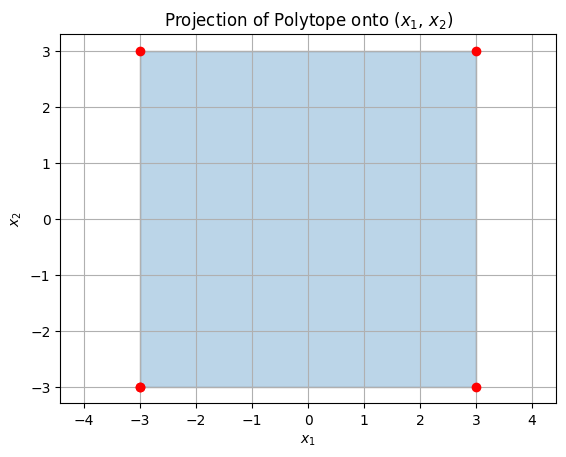

In [52]:
# P = A_inf_hist[-1]
# gamma = b_inf_hist[-1]

P = A_inf
gamma = b_inf

GH = sp.linalg.block_diag(A_x, A_u)
G = GH[:, :dim_x]
H = GH[:, dim_x:]
psi = -np.hstack((b_x, b_u))

# print(G,H,psi)

# gamma = np.expand_dims(gamma, axis=1)
# psi = np.expand_dims(psi, axis=1)

A_X1, b_X1 = computeX1(G, H, psi, A_d, B_d, P, gamma)
print(A_X1, b_X1)
plot_polygon(A_X1, b_X1.squeeze())